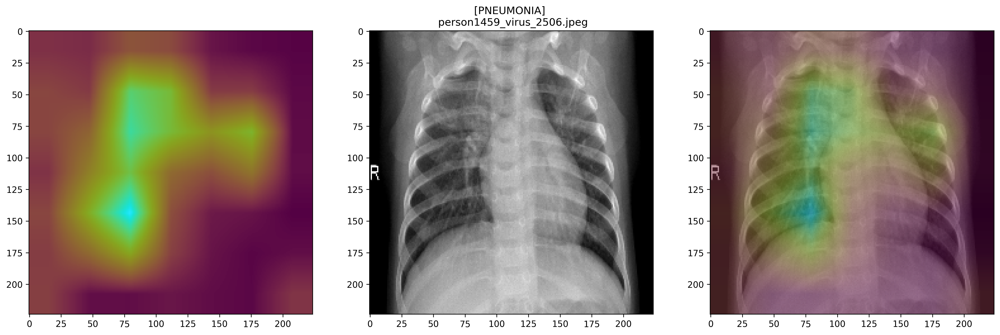

# Pneumonia Detection Using Convolutional Neural Network

Author: **Chi Bui**

## Overview
(source: [Wikipedia](https://en.wikipedia.org/wiki/Pneumonia))

**Pneumonia** is an inflammatory condition of the lung primariy affecting the small air sacs known as **alveoli** in one or both lungs. It can be caused by infection with **viruses** or **bacteria**; and identifying the pathogen responsible for Pneumonia could be highly challenging. 

Diagnosis of Pneumonia often starts with medical history and self reported symptoms, followed by a physical exam that usually includes chest auscultation. A **chest radiograph** would then be recommended if the doctors think the person might have Pneumonia. In adults with normal vital signs and a normal lung examination, the diagnosis is unlikely. 

## Business Problem

Pneumonia remains a common condition associated with considerable morbidity and mortality - each year it affects approximately 450 million people, and results in about 4 million deaths. Outcome is often improved by early diagnosis, while the traditional radiograph assessment usually introduces a delay to the diagnosis and treatment. Therefore, fast and reliable computer-aided diagnosis of the disease based on chest X-ray could be a critical step in improving the outcomes for Pneumonia patients. 

For this project, I have developed and evaluated various Convolutional Neural Networks that can quickly classify Normal vs. Pneumonia frontal chest radiographs. The implementation of these models could help alert doctors and radiologists of potential abnormal pulmonary patterns, and expedite the diagnosis.

## Dataset

The dataset was collected from **Guangzhou Women and Children’s Medical Center** (Guangzhou, China) pediatric patients of one to five years old from.

The dataset is available on:
- [Mendelay Data](https://data.mendeley.com/datasets/rscbjbr9sj/3)
- or [Kaggle](https://www.kaggle.com/paultimothymooney/chest-xray-pneumonia)

The diagnoses for the images were then graded by two expert physicians, and checked by a third expert before being cleared for training the AI system.

## Exploratory Data Analysis

### Data Download & Extraction

In [11]:
import os
import zipfile

Please uncomment below cells to download and extract the dataset.

In [7]:
# !pip install wget
# !python -m wget https://md-datasets-cache-zipfiles-prod.s3.eu-west-1.amazonaws.com/rscbjbr9sj-3.zip

In [8]:
# with zipfile.ZipFile("rscbjbr9sj-3.zip","r") as zip_ref:
#     zip_ref.extractall()

In [9]:
# path_to_data = os.path.join("..", "data")

# with zipfile.ZipFile("ZhangLabdata.zip","r") as zip_ref:
#     zip_ref.extractall(path_to_data)

In [60]:
# !rm rscbjbr9sj-3.zip
# !rm ZhangLabData.zip

### Dataset Structure

The dataset is divided into 2 directories:
- train
- test

Within each directory, there're 2 sub-directories: 
- NORMAL
- PNEUMONIA

and the labels for the images are the names of the corresponding directories they're located in.

```
chest_xray
    │
    ├── test
    │   ├── NORMAL
    │   │   └── image_01.jpeg
    │   └── PNEUMONIA
    │       └── image_02.jpeg
    └── train
        ├── NORMAL
        │   └── image_01.jpeg
        └── PNEUMONIA
            └── image_02.jpeg

```

### Data Preview

First, I will load and view a few images in each group just to have some general ideas of what type of images we will be working with.

In [16]:
# conda install -c conda-forge opencv

#### NORMAL

In [13]:
import numpy as np
import pandas as pd
from keras.preprocessing.image import load_img, ImageDataGenerator
from PIL import Image
import cv2

In [14]:
import warnings
warnings.filterwarnings('ignore')

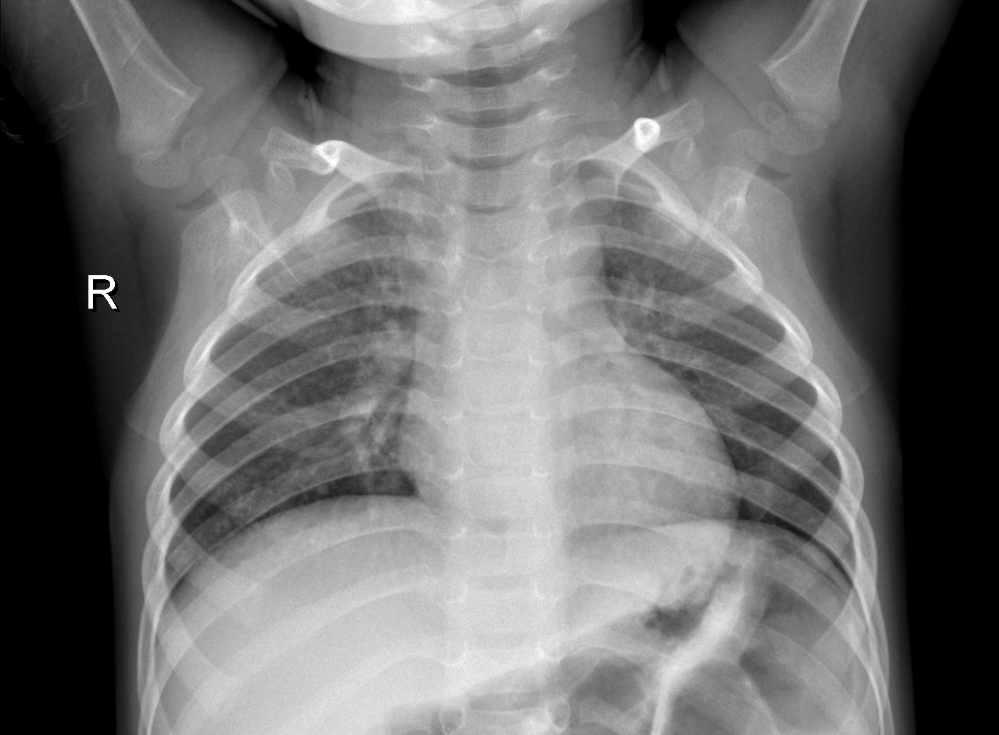

In [17]:
load_img('../data/CellData/chest_xray/train/NORMAL/NORMAL-239549-0001.jpeg')

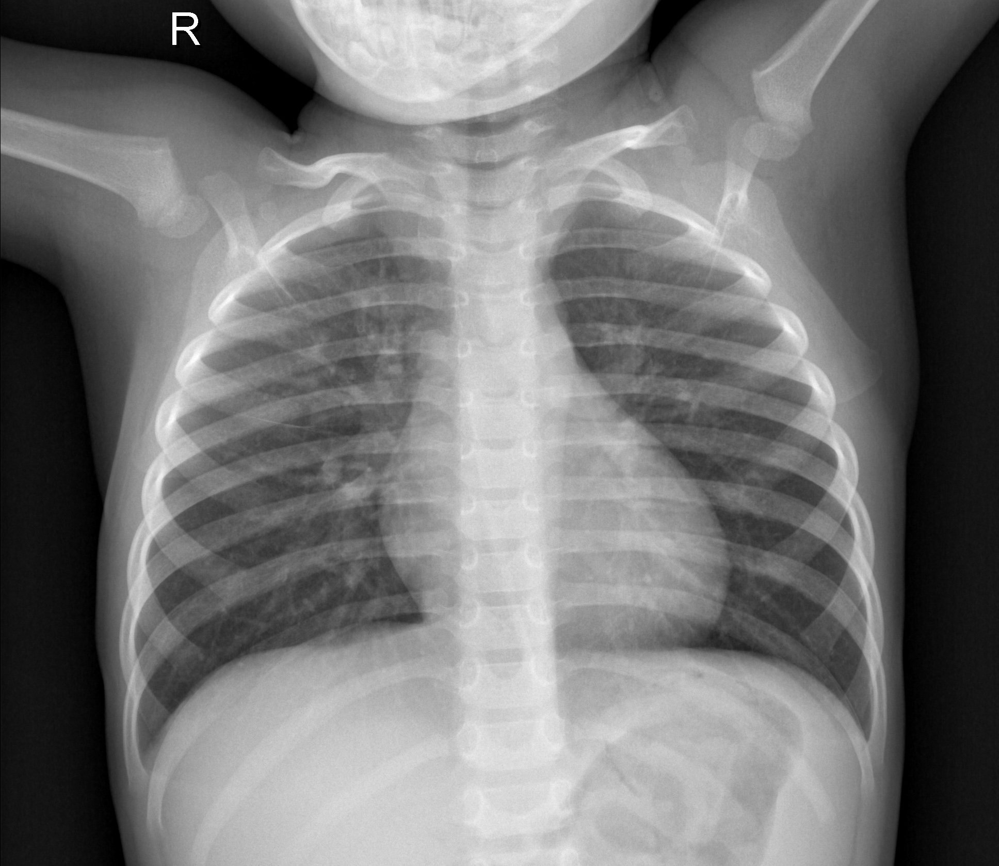

In [18]:
load_img('../data/CellData/chest_xray/train/NORMAL/NORMAL-1955424-0001.jpeg')

#### PNEUMONIA

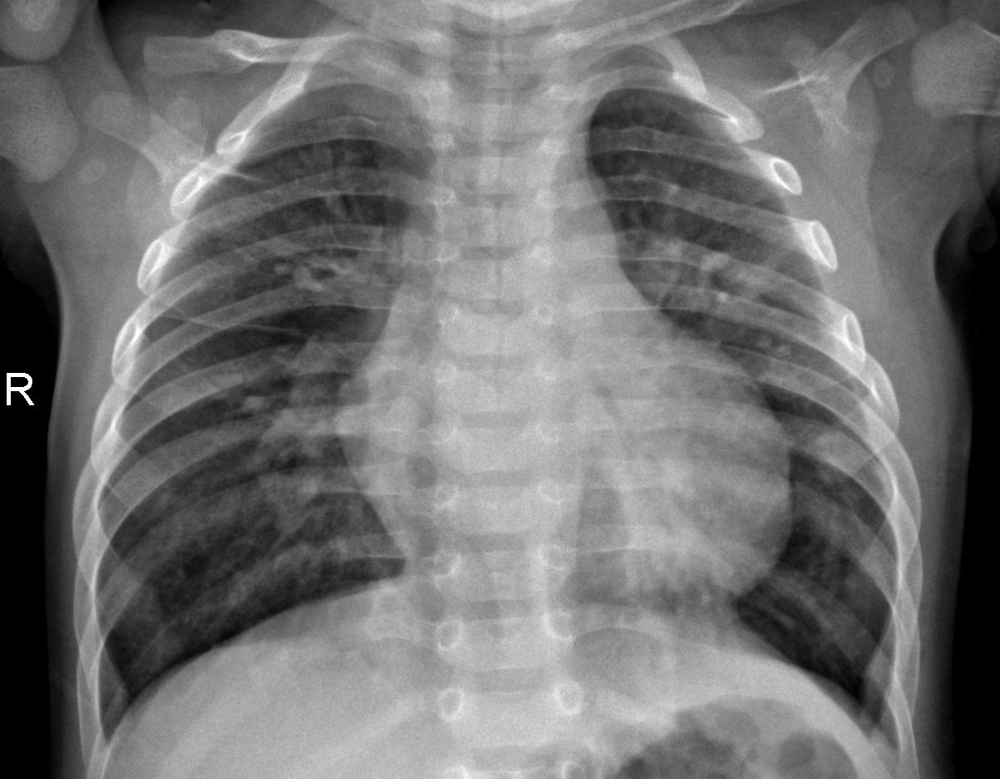

In [19]:
# BACTERIA
load_img('../data/CellData/chest_xray/train/PNEUMONIA/BACTERIA-155541-0004.jpeg')

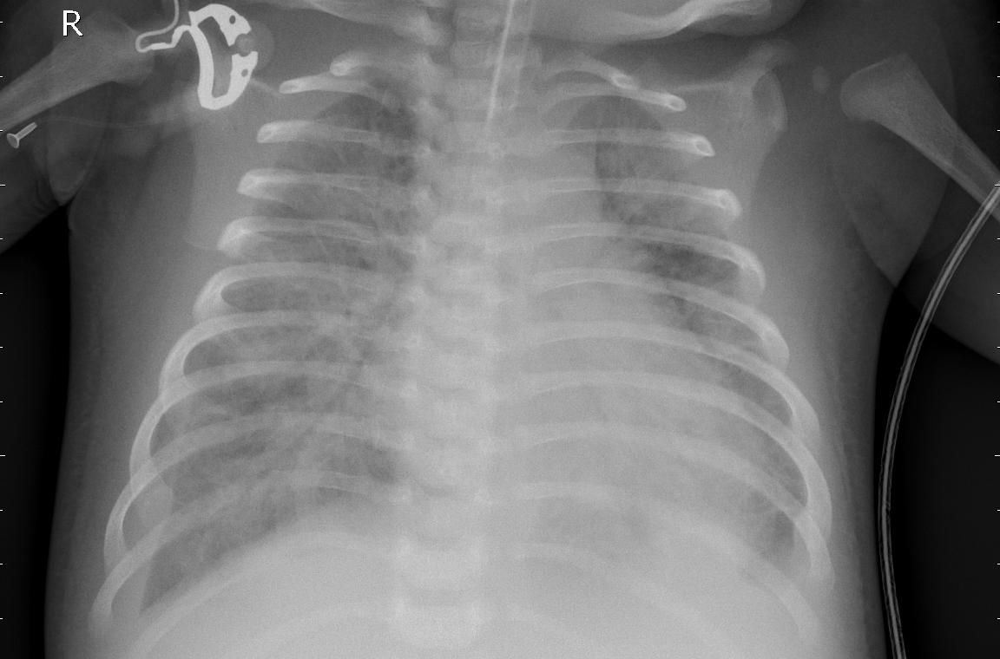

In [50]:
# BACTERIA
load_img('../data/CellData/chest_xray/train/PNEUMONIA/BACTERIA-6961449-0001.jpeg')

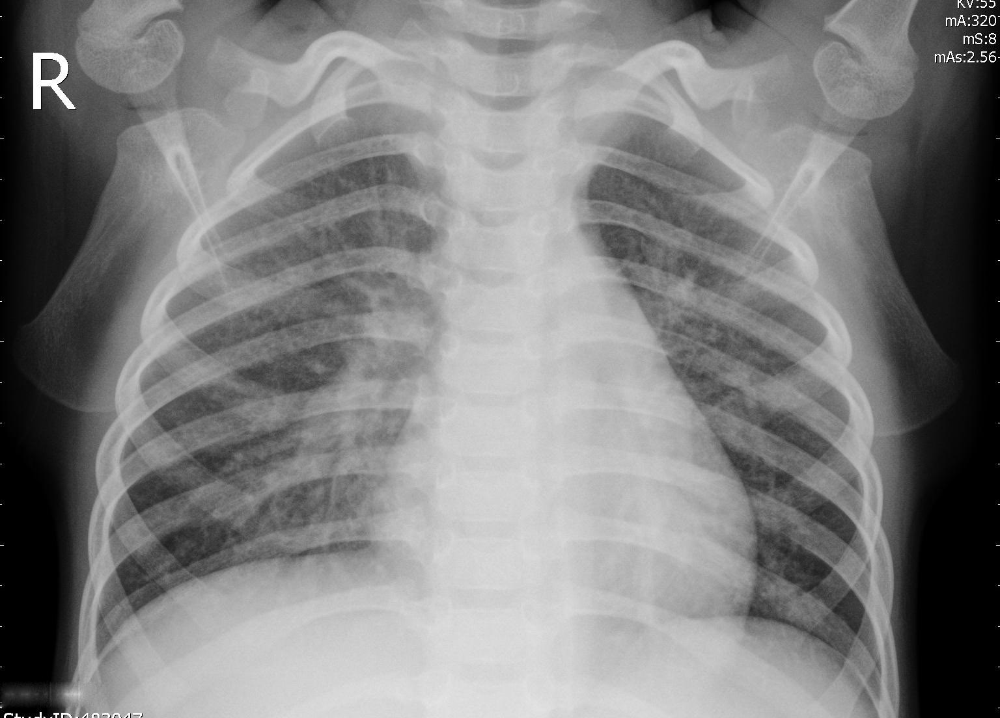

In [21]:
# VIRUS
load_img('../data/CellData/chest_xray/train/PNEUMONIA/VIRUS-614452-0001.jpeg')

It appears that Pneumonia X-rays have a "cloudy" look with higher opacity in the lungs area. The contrast between the bones and the lungs area seems to be higher in 'NORMAL' category X-rays, and we can almost see the lung blood vessels clearly.

However, to be honest, some of the images in these 2 groups look quite similar, and it's not really easy for the untrained eyes to differentiate.

Next, I'll look at the dimensions of these images.

#### Image Size

In [23]:
Image.open('../data/CellData/chest_xray/train/NORMAL/NORMAL-1955424-0001.jpeg').size

(1936, 1677)

In [24]:
Image.open('../data/CellData/chest_xray/train/NORMAL/NORMAL-239549-0001.jpeg').size

(1740, 1279)

In [25]:
Image.open('../data/CellData/chest_xray/train/PNEUMONIA/VIRUS-614452-0001.jpeg').size

(1536, 1104)

In [26]:
Image.open('../data/CellData/chest_xray/train/PNEUMONIA/BACTERIA-6961449-0001.jpeg').size

(1208, 920)

It seems like the images are relatively large, with each dimension being roughly 1000-1800 pixels. They don't have uniform size, therefore, we'll need to rescale them later.

#### Image Shape/Number of Channels

In [62]:
img = cv2.imread('../data/CellData/chest_xray/train/PNEUMONIA/BACTERIA-6961449-0001.jpeg')
print(img.shape)

(920, 1208, 3)


In [28]:
import matplotlib.pyplot as plt
import seaborn as sns

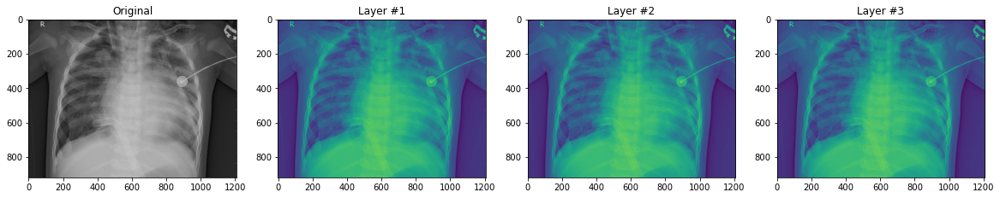

In [63]:
# DISPLAYING ORIGINAL & EACH LAYER SEPARATELY
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(20,5))
axes[0].imshow(img)
axes[0].set_title('Original')

for i in range(1,4):
    ax = axes[i]
    ax.imshow(img[:, :, (i-1)])
    ax.set_title(f'Layer #{i}')
    
plt.savefig('../images/img_breakdown.png', bbox_inches='tight', dpi=300);

At first look, these 3 layers appear to be identical, but we can also reconfirm by comparing the pixel values of the 3 layers:

In [30]:
print((img[:, :, 0] == img[:, :, 1]).all())
print((img[:, :, 0] == img[:, :, 2]).all())

True
True


I am not entirely sure why these grayscale X-ray images have 3 channels or RGB, and the numeric values for all 3 layers are exactly the same. For this reason, moving forward, I would set `ImageDataGenerator()`'s `color_mode` to `grayscale` to downsize the dataset, while still retaining the same amount of information.

### DataFrames

#### Class Composition
In order to look at the class composition and evaluate its balancedness, I would create a dataframe with 2 columns:

- **1st column**: name of the image file - called `image`
- **2nd column**: label for that image - called `label`

In [32]:
import glob
from pathlib import Path

In [33]:
# GET THE DIRECTORY TO THE DATASETS
path_data = '../data/CellData/chest_xray'
path_train = os.path.join(path_data, 'train')
path_test = os.path.join(path_data, 'test')

# INITIATE EMPTY LIST OF TRAINING DATA
# THAT WILL BE CONVERTED TO PANDAS DATAFRAME LATER
data_train = []
data_test = []
data = [data_train, data_test]

# ITERATE THROUGH EACH PATH
for i, d in enumerate([path_train, path_test]):
    # GET THE PATH TO EACH FOLDER - NORMAL AND PNEUMONIA
    normal = os.path.join(d, 'NORMAL')
    pneumonia = os.path.join(d, 'PNEUMONIA')
    
    # FETCH ALL .jpeg FILES
    normal_imgs = Path(normal).glob('*.jpeg')
    pneumonia_imgs = Path(pneumonia).glob('*.jpeg')
    
    # APPEND THE NAME AND CORRESPONDING LABEL (BASED ON FOLDER NAME)
    # TO data_train list AS TUPLES
    for img in normal_imgs:
        data[i].append((str(img), 0))
    
    for img in pneumonia_imgs:
        data[i].append((str(img), 1))

In [34]:
# CONVERT data_train TO DATAFRAME FOR EASY MANIPULATION
columns = ['image', 'label']

train_df = pd.DataFrame(data_train, columns=columns)
test_df = pd.DataFrame(data_test, columns=columns)

In [35]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5232 entries, 0 to 5231
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   5232 non-null   object
 1   label   5232 non-null   int64 
dtypes: int64(1), object(1)
memory usage: 81.9+ KB


In [36]:
train_df.label.value_counts(normalize=True)

1    0.742164
0    0.257836
Name: label, dtype: float64

In [37]:
test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 624 entries, 0 to 623
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   624 non-null    object
 1   label   624 non-null    int64 
dtypes: int64(1), object(1)
memory usage: 9.9+ KB


In [38]:
test_df.label.value_counts(normalize=True)

1    0.625
0    0.375
Name: label, dtype: float64

There are 5232 images in the training set (with an approximately 3:1 class ratio), and only 16 in validation (with a 1:1 ratio).

Due to a potential "mislabeling" issue in the test data (which has been raised about this dataset in various different platforms), I'm going to concatenate both sets together and re-split them into Train/Validation/Test later to ensure data consistency.

In [39]:
# CONCAT train_df and val_df
master_df = pd.concat([train_df, test_df])
# RESET INDEX (SO THERE WON'T BE ANY DUPLICATED INDICES) BY DROPPING OLD ONES
master_df.reset_index(inplace=True, drop=True)

In [40]:
master_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5856 entries, 0 to 5855
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   5856 non-null   object
 1   label   5856 non-null   int64 
dtypes: int64(1), object(1)
memory usage: 91.6+ KB


In [41]:
# CHECK FOR DUPLICATES
master_df.duplicated().any()

False

In [42]:
# FETCH 10 RANDOM SAMPLES FROM master_df
master_df.sample(10, random_state=42)

,image,label
3649,../data/CellData/chest_xray/train/PNEUMONIA/BA...,1
4211,../data/CellData/chest_xray/train/PNEUMONIA/BA...,1
960,../data/CellData/chest_xray/train/NORMAL/NORMA...,0
23,../data/CellData/chest_xray/train/NORMAL/NORMA...,0
810,../data/CellData/chest_xray/train/NORMAL/NORMA...,0
1670,../data/CellData/chest_xray/train/PNEUMONIA/BA...,1
1176,../data/CellData/chest_xray/train/NORMAL/NORMA...,0
2579,../data/CellData/chest_xray/train/PNEUMONIA/BA...,1
4333,../data/CellData/chest_xray/train/PNEUMONIA/VI...,1
1897,../data/CellData/chest_xray/train/PNEUMONIA/BA...,1


In [75]:
4273 + 1583

5856

In [43]:
master_df.label.value_counts()

1    4273
0    1583
Name: label, dtype: int64

In [44]:
master_df.label.value_counts(normalize=True)

1    0.729679
0    0.270321
Name: label, dtype: float64

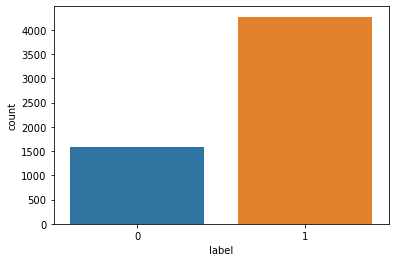

In [65]:
sns.countplot(x='label', data=master_df)
plt.savefig('../images/class_ratio.png', bbox_inches='tight', dpi=300);

#### Pneumonia Types

Within the Pneumonia class itself, there are two different types: Bacteria and Virus. These 2 subclasses have their own identifable characteristics:
- **Bacterial pneumonia** typically exhibits a focal lobar consolidation
- whereas **Viral pneumonia** manifests with a more diffuse ‘‘interstitial’’ pattern in both lungs

These differences would potentially impact the models' capabilities to differentiate the X-ray images; therefore it might be valuable to include this information in the model evaluation. This would not be the main focus of this project, but it would certainly provide some information for us to dig deeper into this topic in the future, and perhaps train models to classify different types of Pneumonia.

In [47]:
def cat_pneumonia_type(x):
    if 'BACTERIA' in x:
        output = 'bacteria'
    elif 'VIRUS' in x:
        output = 'virus'
    else:
        output = 'normal'
    return output

In [48]:
master_df['type'] = master_df.image.apply(lambda x: cat_pneumonia_type(x))

In [49]:
master_df.type.value_counts()

bacteria    2780
normal      1583
virus       1493
Name: type, dtype: int64

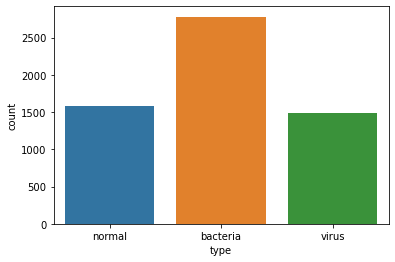

In [67]:
sns.countplot(x='type', data=master_df)
plt.savefig('../images/composition.png', bbox_inches='tight', dpi=300);

4273 datapoints in our master dataset are categorized as PNEUMONIA, which accounts for roughly 73% of the whole set: 

- Roughly 2/3 of the Pneumonia X-ray images are Bacterial Pneumonia
- The other 1/3 are Viral

This means that we're working with a highly imbalanced dataset, and I would need to counter this by assigning class weights or incorporating some image augmentation methods later. Our models are also going to be less exposed to Viral Pneumonia, and might struggle with these X-ray more than with Bacterial.

### Dataset Splitting

In [51]:
from sklearn.model_selection import train_test_split

In [52]:
# TRAIN TEST SPLIT (TEST SIZE = 15%)
master_train_df, test_df = train_test_split(master_df, test_size=0.15, random_state=42)

In [53]:
# TRAIN VALIDATION SPLIT (VALIDATION SIZE = 20%)
train_df, val_df = train_test_split(master_train_df, test_size=0.2, random_state=42)

In [54]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3981 entries, 583 to 5210
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   3981 non-null   object
 1   label   3981 non-null   int64 
 2   type    3981 non-null   object
dtypes: int64(1), object(2)
memory usage: 124.4+ KB


In [55]:
val_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 996 entries, 5635 to 1882
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   996 non-null    object
 1   label   996 non-null    int64 
 2   type    996 non-null    object
dtypes: int64(1), object(2)
memory usage: 31.1+ KB


In [56]:
test_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 879 entries, 3649 to 2153
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   879 non-null    object
 1   label   879 non-null    int64 
 2   type    879 non-null    object
dtypes: int64(1), object(2)
memory usage: 27.5+ KB


### Data Generators

Next, we'll use `ImageDataGenerator` to create batches of data for visualization as well as modeling training later on.

In [69]:
BATCH_SIZE = 32

# CREATE GENERATOR FOR TRAINING DATA (FROM train_df DATAFRAME)
train_generator = ImageDataGenerator(rescale=1.0/255).flow_from_dataframe(
    dataframe=train_df, x_col='image', y_col='label',
    color_mode='grayscale',   # only keeping 1 channel of the images
    class_mode='raw',
    target_size=(180,180),   # resizing all images to 180 x 180 pixel
    batch_size=BATCH_SIZE,
    seed=42,
    shuffle=True   # shuffle so we're not missing out on any samples
)

# CREATE GENERATOR FOR VALIDATION DATA (FROM val_df DATAFRAME)
val_generator = ImageDataGenerator(rescale=1.0/255).flow_from_dataframe(
    dataframe=val_df, x_col='image', y_col='label',
    color_mode='grayscale',
    class_mode='raw',
    target_size=(180,180), 
    batch_size=BATCH_SIZE,
    seed=42,
    shuffle=True
)

Found 3981 validated image filenames.
Found 996 validated image filenames.


In [70]:
# CHECKING THE SHAPE OF 1 BATCH OF THE train_generator
images_train, labels_train = next(train_generator)
print(f'Training set: {images_train.shape} | {labels_train.shape}')

Training set: (32, 180, 180, 1) | (32,)


The shape printout shows that we have 32 images with 32 corresonding labels. Each image is in grayscale (1 channel) and 180 x 180 pixel in size.

### Data Visualization

Next, I am going to display the first 16 images of the first batch with their corresponding labels:

- 0 - NORMAL
- 1 - PNEUMONIA

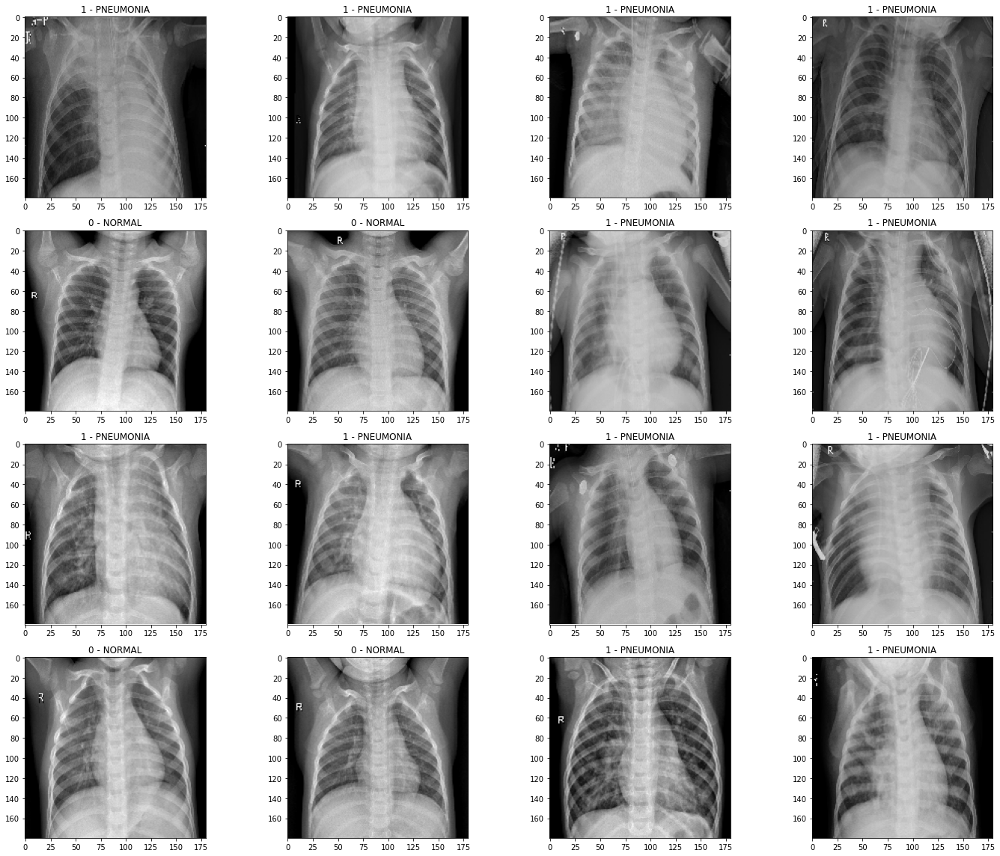

In [72]:
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(20,16))
label_output = {0: 'NORMAL', 1: 'PNEUMONIA'}
i = range(16)

for i in range(16):
    ax = axes[i // 4][i % 4]
    ax.imshow(images_train[i], cmap='gray')
    ax.set_title(f'{labels_train[i]} - {label_output[labels_train[i]]}')
    
plt.tight_layout()
plt.savefig('../images/samples_16.png', bbox_inches='tight', dpi=300);
plt.show();

## Modeling

### Convolutional Neural Networks (CNN)
(Source: **Hands-on Machine Learning with Scikit-Learn, Keras & TensorFlow** - Aurelien Geron)

Convolutional Neural Networks have proved to be highly accurate with Image Recognition tasks, partly due to its resemblence of nature.

David H. Hubel and Torsten Wiesel's experiments on cats (in 1958 and 1959), and on monkeys a few years later has led them to discover some crucial insights into the structure of the visual cortex:
- They found out that many neurons in the visual cortex have a small ***local receptive field*** (which means they only react to visual stimuli in a limited region of the visual field). The receptive fields of different neurons may overlap, and together they tile the whole visual field.
- In addition, some neurons react only to images of horizontal lines, while others react to lines with different orientations (two neurons with the same receptive field might detect different line orientations). 

These studies of the visual cortex had inspired the **neocognitron** in the 80s, which gradually evolved into modern **convolutional neural networks**.

1. **Convolutional Layers**
Convolutional Layer is the building block of CNN. Neurons in the 1st convolutional layer are only connected to pixels in their receptive field. Then each neuron in the 2nd convolutional layer is only connected to neurons within their receptive field in the 1st layer, and so on. This hierarchical structure resembles real-world images 

2. **Pooling Layers**
The goal of pooling layer is to *subsample* the input image inorder to reduce computational load, memory usage, and number of parameters.

### Metrics
Since the objective of this project is to create a model that helps speed up the diagnosis of Pneumonia and the Accuracy for a highly imbalanced dataset could be skewed, prioritizing a high Recall score and reducing the number of False Negatives (actual Pneumonia cases that are classified as Normal) would be my main goal as I go through model iterations.

Since we're working with an imbalanced dataset with the majority being Pneumonia, a model that predicts everything as Pneumonia would have approx. 73% accuracy (depending on the class ratio of the evaluation set this might vary more or less). If not corrected, models trained on the imbalanced dataset would have the tendency to predict more of the abundant class (which is 1-PNEUMONIA in this case). 

From the business stand point, a model trained on imbalanced data like this is not entirely bad, because it would reduce the risk of mis-classifying PNEUMONIA cases as NORMAL. Although that could cause some inconveniencies to the patients, it would helps ensure higher chance of catching the disease early. However, not correcting class imbalance could also lead to models not learning to differentiate images of the 2 classes efficiently and not picking up the important features of the images.

In [307]:
import tensorflow as tf
from tensorflow import keras
from keras.models import Sequential, load_model
from keras.layers import Dense, Conv2D, Flatten, MaxPooling2D, Dropout, GlobalAveragePooling2D
from keras.metrics import Recall, Precision
from sklearn.metrics import confusion_matrix
from keras.callbacks import ModelCheckpoint, EarlyStopping
from keras.optimizers.schedules import ExponentialDecay

### Baseline Model
For my **Baseline model**, I am just going to construct a simple Convolution Neural Networks (CNN) model with:

- 1 Layer of Convolution 2D with padding
- 1 Layer of MaxPooling 2D
- 1 Hidden Layer of Dense NN

(This architecture have been selected arbitrarily for the most part, and will be adjusted later depending on outcome).

In [90]:
# CONSTRUCT EACH LAYER OF THE MODEL
baseline = Sequential()
baseline.add(Conv2D(32, (3,3), activation='relu', padding='same',
               input_shape=[180,180,1]))
baseline.add(MaxPooling2D(pool_size=(2,2)))
baseline.add(Flatten())
baseline.add(Dense(32, activation='relu'))
baseline.add(Dense(1, activation='sigmoid'))

In [91]:
# INSTANTIATE METRIC OBJECTS
recall = Recall()
precision = Precision()

In [92]:
# COMPILE BASELINE MODEL
baseline.compile(loss='binary_crossentropy',
                 optimizer='adam',
                 metrics=['accuracy', recall, precision])

In [93]:
# PRINT OUT MODEL SUMMARY
baseline.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 180, 180, 32)      320       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 90, 90, 32)        0         
_________________________________________________________________
flatten (Flatten)            (None, 259200)            0         
_________________________________________________________________
dense (Dense)                (None, 32)                8294432   
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 33        
Total params: 8,294,785
Trainable params: 8,294,785
Non-trainable params: 0
_________________________________________________________________


In [94]:
# INSTANTIATE ModelCheckpoint AND EarlyStopping OBJECTS
checkpoint_cb = ModelCheckpoint('baseline.h5',
                                save_best_only=True)
early_stopping_cb = EarlyStopping(patience=10,
                                  restore_best_weights=True)

# ASSIGN BATCH SIZE AND EPOCH VALUES
BATCH_SIZE = 32
EPOCHS = 30

# FIT MODEL TO IMAGE DATA GENERATOR
results_1 = baseline.fit(train_generator, 
                         validation_data=val_generator,
                         epochs=EPOCHS,
                         steps_per_epoch=(train_generator.n//BATCH_SIZE),
                         validation_steps=(val_generator.n//BATCH_SIZE),
                         callbacks=[checkpoint_cb, early_stopping_cb],
                         use_multiprocessing=True,
                         workers=8)

Epoch 1/30
124/124 [==============================] - 41s 284ms/step - loss: 1.0657 - accuracy: 0.7903 - recall: 0.8542 - precision: 0.8587 - val_loss: 0.1851 - val_accuracy: 0.9173 - val_recall: 0.9932 - val_precision: 0.9041
Epoch 2/30
124/124 [==============================] - 36s 276ms/step - loss: 0.1582 - accuracy: 0.9396 - recall: 0.9636 - precision: 0.9530 - val_loss: 0.1087 - val_accuracy: 0.9597 - val_recall: 0.9604 - val_precision: 0.9846
Epoch 3/30
124/124 [==============================] - 35s 267ms/step - loss: 0.1116 - accuracy: 0.9581 - recall: 0.9728 - precision: 0.9699 - val_loss: 0.0968 - val_accuracy: 0.9567 - val_recall: 0.9849 - val_precision: 0.9574
Epoch 4/30
124/124 [==============================] - 36s 272ms/step - loss: 0.0777 - accuracy: 0.9770 - recall: 0.9875 - precision: 0.9811 - val_loss: 0.0937 - val_accuracy: 0.9647 - val_recall: 0.9685 - val_precision: 0.9833
Epoch 5/30
124/124 [==============================] - 35s 272ms/step - loss: 0.0699 - accura

In [95]:
# VISUALIZE MODEL PERFORMANCE
def visualize_training_results(results):
    history = results.history
    
    for m in ['loss', 'accuracy', 'precision', 'recall']:
        plt.figure(figsize=(15,5))
        plt.plot(history[m], label='Training', marker='o', color='blue')
        plt.plot(history[f'val_{m}'], label='Validation', marker='o', color='red')
        plt.xlabel('Epochs')
        plt.legend()
        plt.title(m.title())
    
    plt.show();

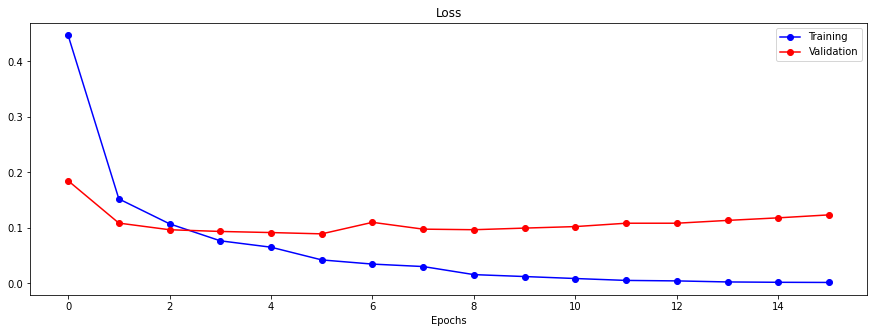

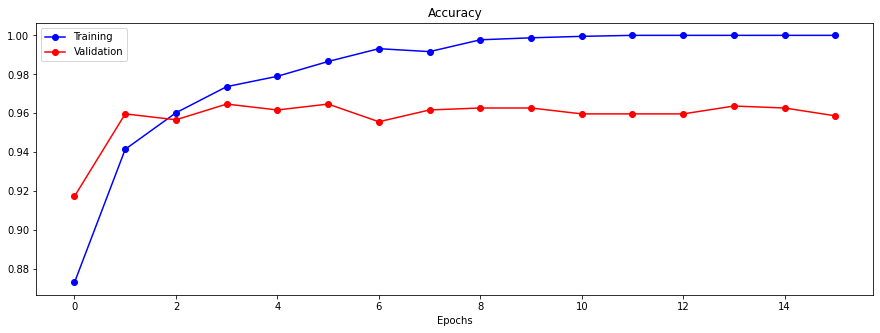

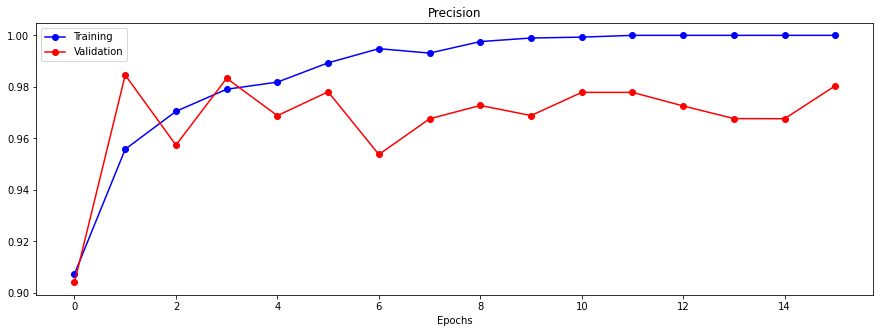

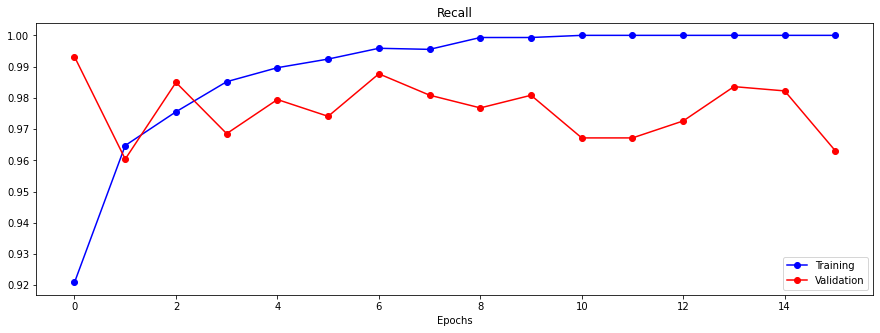

In [96]:
visualize_training_results(results_1)

The plots of Loss, Accuracy, and Precision displayed nice converging lines. At first look, Recall might look a bit unstable, but then if we pay attention to the y-axis of the Recall plot, we'll see that it was fluctuating within a smaller range than Accuracy and Precision ([0.92, 1.0] compared to [0.88, 1.0] and [0.90,1.0] repectively). The gap between training & validation performance on all 3 metrics is around 3-5%, which is not bad.

Overall, these metric outputs are very high for a simple baseline model.

In [97]:
# GENERATE PREDICTIONS ON TRAINING & VALIDATION DATA

# RECREATE GENERATORS FOR TRAINING & VALIDATION SET WITH shuffle = False
# IN ORDER TO PRESERVE THE ORDER OF THE IMAGES AND THEIR LABELS

train_eval_generator = ImageDataGenerator(rescale=1.0/255).flow_from_dataframe(
    dataframe=train_df, x_col='image', y_col='label',
    class_mode='raw',
    color_mode='grayscale',
    target_size=(180,180), batch_size=BATCH_SIZE,
    seed=2021,
    shuffle=False     # not shuffle so that the predicts come out in the same order as in the original dataset
)

val_eval_generator = ImageDataGenerator(rescale=1.0/255).flow_from_dataframe(
    dataframe=val_df, x_col='image', y_col='label',
    class_mode='raw',
    color_mode='grayscale',
    target_size=(180,180), batch_size=BATCH_SIZE,
    seed=2021,
    shuffle=False
)

# MAKE PREDICTIONS USING THE EVALUATION GENERATORS
preds_train_1 = baseline.predict(train_eval_generator, 
                                   steps=(train_generator.n//BATCH_SIZE+1), 
                                   verbose=1,
                                   workers=8)
preds_val_1 = baseline.predict(val_eval_generator, 
                                 steps=(val_generator.n//BATCH_SIZE+1),
                                 verbose=1,
                                 workers=8)

Found 3981 validated image filenames.
Found 996 validated image filenames.
32/32 [==============================] - 7s 161ms/step


In [98]:
baseline_metrics = baseline.evaluate(val_eval_generator)
baseline_metrics

32/32 [==============================] - 8s 254ms/step - loss: 0.0892 - accuracy: 0.9649 - recall: 0.9741 - precision: 0.9781


[0.08916319161653519,
 0.9648594260215759,
 0.9741144180297852,
 0.9781121611595154]

In [99]:
# CREATE A DATAFRAME TO KEEP TRACK OF ALL MODELS PERFOMANCE ON VALIDATION SET
perf_df = pd.DataFrame(columns=['model', 'loss', 'accuracy', 'recall', 'precision'])

# APPEND BASELINE NUMBERS TO DATAFRAME
perf_df.loc[len(perf_df.index)] = ['baseline'] + baseline_metrics

In [100]:
perf_df

,model,loss,accuracy,recall,precision
0,baseline,0.089163,0.964859,0.974114,0.978112


In [101]:
def plot_confusionmatrix(dataset_name, y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred)
    
    ax= plt.subplot()
    # annot=True to annotate cells, ftm='g' to disable scientific notation
    sns.heatmap(cm, annot=True, fmt='g', ax=ax)

    # labels, title and ticks
    ax.set_xlabel('Predicted labels')
    ax.set_ylabel('True labels')
    ax.set_title(f'Confusion Matrix for {dataset_name}')
    ax.xaxis.set_ticklabels(['NORMAL', 'PNEUMONIA'])
    ax.yaxis.set_ticklabels(['NORMAL', 'PNEUMONIA'])
    plt.show();

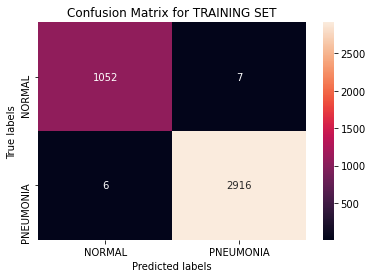

In [102]:
# PLOT CONFUSION MATRIX FOR TRAINING SET
# (converting predicted values from float to nearest integer)
plot_confusionmatrix('TRAINING SET', train_df['label'], np.rint(preds_train_1)) 

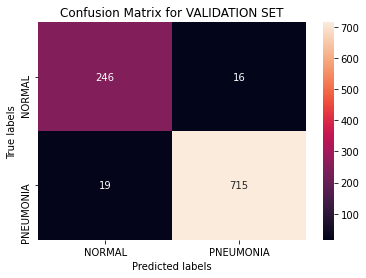

In [103]:
# PLOT CONFUSION MATRIX FOR VALIDATION SET
plot_confusionmatrix('VALIDATION SET', val_df['label'], np.rint(preds_val_1))

In [104]:
val_df.label.value_counts()

1    734
0    262
Name: label, dtype: int64

Using `np.int()` on the probability predictions is the equivalent of using a decision threshold of 0.5. This is something that we could tune later if need be.

Overall the model perform relatively well on unseen data (validation set). Out of 734 Pneumonia cases, it accurately identified 715, and gave us a Recall score of 97.41%, which is very high for a simple baseline model.

In [105]:
# SAVE THE MODEL
baseline.save("baseline.h5")

In [135]:
# APPEND PREDICTIONS OF THE BASELINE MODEL TO val_df FOR COMPARISON WITH
# OTHER MODELS LATER
val_df['baseline_pred'] = preds_val_1

# FALSE NEGATIVES BY BASELINE MODEL
# USING PROBABILITY THRESHOLD OF 0.5
fn = val_df[(val_df.label - np.rint(val_df.baseline_pred)) == 1]
fn

,image,label,type,baseline_pred,cnn_2_pred
3794,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.130014,0.128975
4488,../input/chest-xray-pneumonia/chest_xray/train...,1,bacteria,0.022183,0.125026
1839,../input/chest-xray-pneumonia/chest_xray/train...,1,bacteria,0.241918,0.507621
4118,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.049275,0.074938
4051,../input/chest-xray-pneumonia/chest_xray/train...,1,bacteria,0.374392,0.964911
3103,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.044302,0.108721
4906,../input/chest-xray-pneumonia/chest_xray/train...,1,bacteria,0.149601,0.056519
4463,../input/chest-xray-pneumonia/chest_xray/train...,1,bacteria,0.058665,0.106653
2375,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.476251,0.895320
2903,../input/chest-xray-pneumonia/chest_xray/train...,1,bacteria,0.326821,0.958639


In [136]:
fn[fn.baseline_pred >= .4]

,image,label,type,baseline_pred,cnn_2_pred
2375,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.476251,0.895320
4334,../input/chest-xray-pneumonia/chest_xray/train...,1,bacteria,0.488761,0.532120
1415,../input/chest-xray-pneumonia/chest_xray/train...,1,bacteria,0.457054,0.317731


Looking at the False Negatives Dataframe above, we can see that the highest probability among all the False Negatives is still 0.488761, and if the threshold were to be adjusted to 0.4, it'd reduce the number of False Negatives by 3 datapoint.

In [137]:
fn_generator = ImageDataGenerator(rescale=1.0/255).flow_from_dataframe(
    dataframe=fn, x_col='image', y_col='baseline_pred',
    class_mode='raw',
    color_mode='grayscale',
    target_size=(180,180), batch_size=BATCH_SIZE,
    shuffle=False
)

fn_images, fn_prob = next(fn_generator)

Found 19 validated image filenames.


False Negative Cases by Baseline Model using Probability Threshold = 0.5



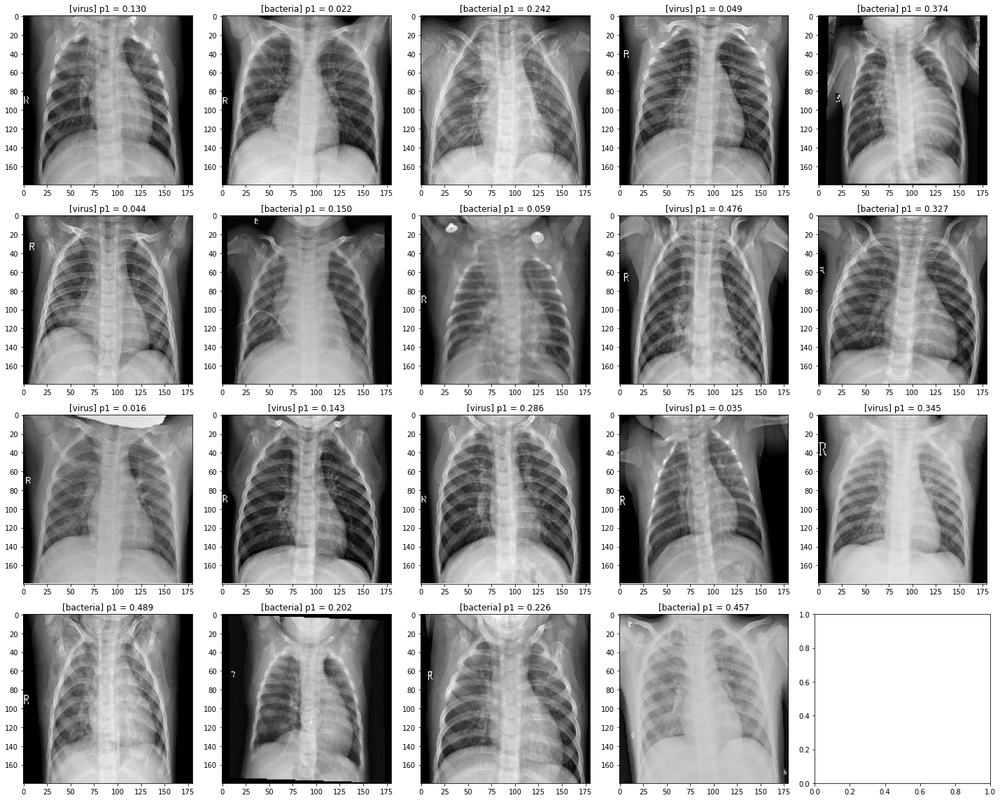

In [138]:
print('False Negative Cases by Baseline Model using Probability Threshold = 0.5')
print()
n = len(fn)
fig, axes = plt.subplots(nrows=4, ncols=5, figsize=(20,(n//5+1)*4))

for i in range(n):
    ax = axes[i // 5][i % 5]
    ax.imshow(fn_images[i], cmap='gray')
    ax.set_title('[{}] p1 = {:.3f}'.format(fn.iloc[i].type, fn_prob[i]))

plt.tight_layout()
plt.show();

In [111]:
# CHECKING THE NUMBER OF BACTERIAL VS. VIRAL PNEUMONIA IN FALSE NEGATIVES
fn.type.value_counts()

bacteria    10
virus        9
Name: type, dtype: int64

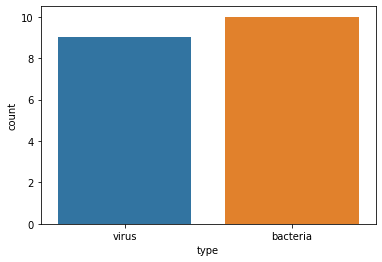

In [112]:
sns.countplot(x='type', data=fn);

### Model #2: Adding More Convolutional, MaxPooling, and Hidden Dense layers

Next, I am going to construct another Convolutional Neural Networks (CNN) model with more Convolutional & MaxPooling layers, and 1 more hidden Dense layer to see if they migh help increase model performance further:

- 1 Layer of Convolution 2D with padding
- 1 Layer of MaxPooling 2D
- 1 Layer of Convolution 2D with padding
- 1 Layer of MaxPooling 2D
- 2 Hidden Dense Layers with more Neurons

(This architecture have been selected arbitrarily for the most part, and will be adjusted later based on outcome).

In [113]:
cnn_2 = Sequential()
cnn_2.add(Conv2D(32, (3,3), activation='relu', padding='same',
               input_shape=[180,180,1]))
cnn_2.add(MaxPooling2D(pool_size=(2,2)))
cnn_2.add(Conv2D(32, (3,3), activation='relu', padding='same'))
cnn_2.add(MaxPooling2D(pool_size=(2,2)))
cnn_2.add(Flatten())
cnn_2.add(Dense(128, activation='relu'))
cnn_2.add(Dense(64, activation='relu'))
cnn_2.add(Dense(1, activation='sigmoid'))

In [115]:
# COMPILE THE MODEL
cnn_2.compile(loss='binary_crossentropy',
              optimizer='adam',
              metrics=['accuracy', recall, precision])
# PRINT OUT MODEL SUMMARY
cnn_2.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 180, 180, 32)      320       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 90, 90, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 90, 90, 32)        9248      
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 45, 45, 32)        0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 64800)             0         
_________________________________________________________________
dense_2 (Dense)              (None, 128)               8294528   
_________________________________________________________________
dense_3 (Dense)              (None, 64)               

In [117]:
# INSTANTIATE ModelCheckpoint AND EarlyStopping OBJECTS
checkpoint_cb = ModelCheckpoint('cnn_2.h5',
                                save_best_only=True)
early_stopping_cb = EarlyStopping(patience=10,
                                  restore_best_weights=True)

# ASSIGN BATCH SIZE AND EPOCH VALUES
BATCH_SIZE = 32
EPOCHS = 30

# FIT MODEL TO DATA
results_2 = cnn_2.fit(train_generator, 
                      validation_data=val_generator,
                      epochs=EPOCHS,
                      steps_per_epoch=(train_generator.n//BATCH_SIZE),
                      validation_steps=(val_generator.n//BATCH_SIZE),
                      callbacks=[checkpoint_cb, early_stopping_cb],
                      use_multiprocessing=True,
                      workers=8)

Epoch 1/30
124/124 [==============================] - 37s 273ms/step - loss: 0.4693 - accuracy: 0.7929 - recall: 0.9535 - precision: 0.8840 - val_loss: 0.1103 - val_accuracy: 0.9546 - val_recall: 0.9617 - val_precision: 0.9764
Epoch 2/30
124/124 [==============================] - 35s 269ms/step - loss: 0.1628 - accuracy: 0.9442 - recall: 0.9693 - precision: 0.9550 - val_loss: 0.1593 - val_accuracy: 0.9325 - val_recall: 0.9932 - val_precision: 0.9212
Epoch 3/30
124/124 [==============================] - 35s 270ms/step - loss: 0.1312 - accuracy: 0.9513 - recall: 0.9722 - precision: 0.9625 - val_loss: 0.1241 - val_accuracy: 0.9556 - val_recall: 0.9904 - val_precision: 0.9514
Epoch 4/30
124/124 [==============================] - 35s 270ms/step - loss: 0.0980 - accuracy: 0.9652 - recall: 0.9801 - precision: 0.9729 - val_loss: 0.0954 - val_accuracy: 0.9647 - val_recall: 0.9822 - val_precision: 0.9703
Epoch 5/30
124/124 [==============================] - 35s 270ms/step - loss: 0.0717 - accura

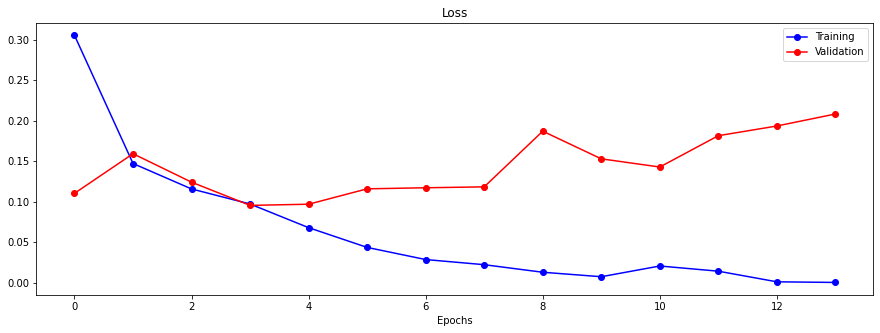

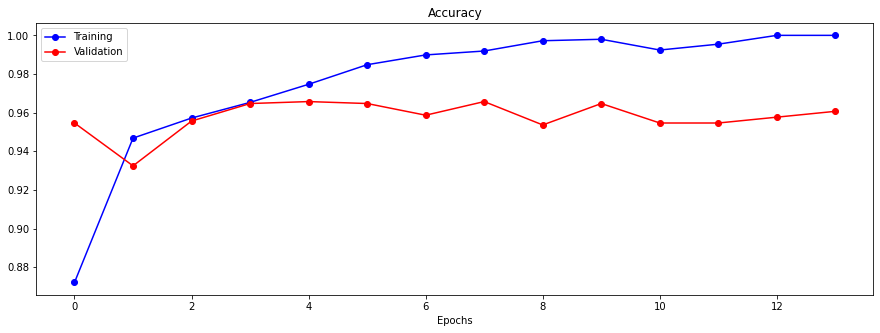

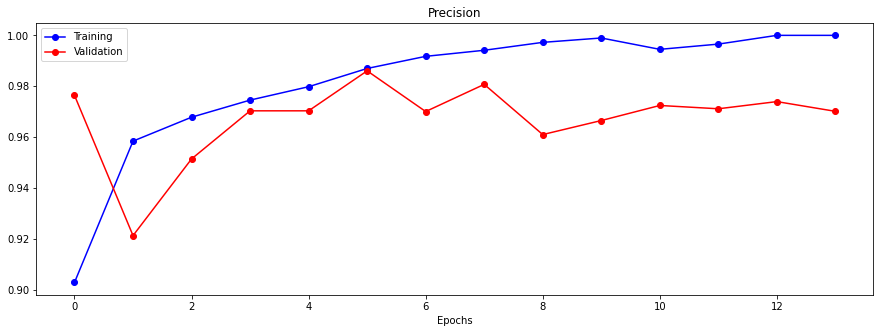

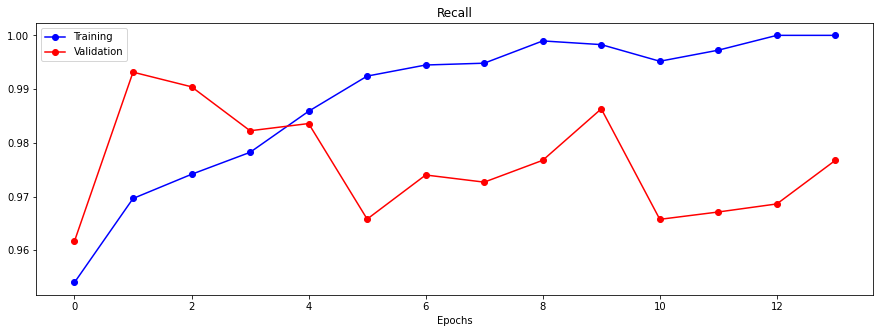

In [118]:
visualize_training_results(results_2)

In [119]:
# MAKE PREDICTIONS USING THE EVALUATION GENERATORS
preds_train_2 = cnn_2.predict(train_eval_generator, 
                                steps=(train_generator.n//BATCH_SIZE+1), 
                                verbose=1,
                                workers=8)
preds_val_2 = cnn_2.predict(val_eval_generator, 
                              steps=(val_generator.n//BATCH_SIZE+1),
                              verbose=1,
                              workers=8)

32/32 [==============================] - 6s 157ms/step


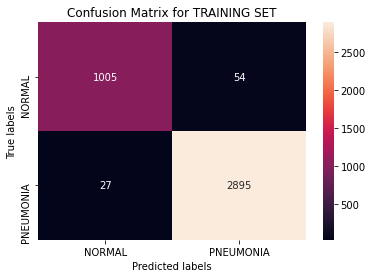

In [120]:
# PLOT CONFUSION MATRIX FOR TRAINING SET
# (converting predicted values from float to nearest integer)
plot_confusionmatrix('TRAINING SET', train_df['label'], np.rint(preds_train_2))  

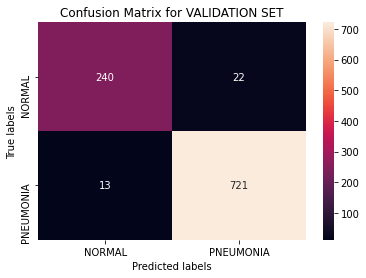

In [121]:
# PLOT CONFUSION MATRIX FOR VALIDATION SET
plot_confusionmatrix('VALIDATION SET', val_df['label'], np.rint(preds_val_2))

In [123]:
cnn_2_metrics = cnn_2.evaluate(val_eval_generator)

32/32 [==============================] - 8s 262ms/step - loss: 0.1135 - accuracy: 0.9608 - recall: 0.9823 - precision: 0.9652


In [124]:
perf_df.loc[len(perf_df.index)] = ['cnn_2'] + cnn_2_metrics
perf_df

,model,loss,accuracy,recall,precision
0,baseline,0.089163,0.964859,0.974114,0.978112
1,cnn_2,0.113521,0.960843,0.982289,0.965194


Model `cnn_2` has a slightly lower accuracy, but its Recall is higher (number of False Negatives has gone from 19 down to 13), although Precision did drop by a small margin. Overall, `cnn_2` has higher loss than `baseline`.

In [125]:
# APPEND PREDICTIONS OF THE cnn_2 MODEL TO val_df FOR COMPARISON WITH
# OTHER MODELS LATER
val_df['cnn_2_pred'] = preds_val_2
val_df.head()

,image,label,type,baseline_pred,cnn_2_pred
5635,../input/chest-xray-pneumonia/chest_xray/test/...,1,bacteria,0.998711,0.999361
2299,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.996441,0.997072
2830,../input/chest-xray-pneumonia/chest_xray/train...,1,bacteria,0.999949,0.999989
4891,../input/chest-xray-pneumonia/chest_xray/train...,1,bacteria,0.993053,0.998941
4367,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.669913,0.874263


In [126]:
# PNEUMONIA CASES THAT HAVE BEEN INCORRECTLY PREDICTED BY cnn_2
fn2 = val_df[(val_df.label - np.rint(val_df.cnn_2_pred)) == 1]
fn2.head()

,image,label,type,baseline_pred,cnn_2_pred
3794,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.130014,0.128975
4488,../input/chest-xray-pneumonia/chest_xray/train...,1,bacteria,0.022183,0.125026
4118,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.049275,0.074938
3103,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.044302,0.108721
3137,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.562891,0.452445


In [128]:
print(len(set(fn2.index) - set(fn.index)))
print(len(set(fn.index) - set(fn2.index)))

1
7


`cnn_2` shared 12 out of 19 False Negatives with `baseline`, plus 1 additional Pneumonia case that were accurately identified by `baseline`.

On the other hand, `cnn_2` correctly predicted 7 Pneumonia cases that `baseline` missed.

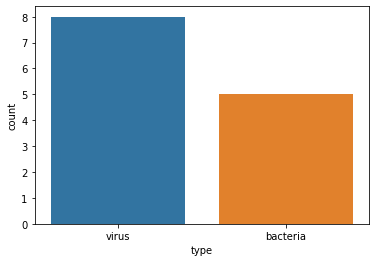

In [129]:
sns.countplot(x='type', data=fn2);

Although `baseline` has more bacterial cases in its False Negatives, `cnn_2` has more virus. 

In [131]:
# PNEUMONIA CASES THAT HAVE BEEN INCORRECTLY PREDICTED BY BOTH MODELS
fn_all = val_df[(val_df.label == 1) & \
                 (np.rint(val_df.baseline_pred) == 0) & \
                 (np.rint(val_df.cnn_2_pred) == 0)]
fn_all

,image,label,type,baseline_pred,cnn_2_pred
3794,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.130014,0.128975
4488,../input/chest-xray-pneumonia/chest_xray/train...,1,bacteria,0.022183,0.125026
4118,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.049275,0.074938
3103,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.044302,0.108721
4906,../input/chest-xray-pneumonia/chest_xray/train...,1,bacteria,0.149601,0.056519
4463,../input/chest-xray-pneumonia/chest_xray/train...,1,bacteria,0.058665,0.106653
1528,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.015524,0.063868
3749,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.286404,0.326252
5190,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.035315,0.013930
4529,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.344601,0.182111


In [132]:
# DISPLAYING SHARED FALSE NEGATIVE CASES
fn_generator = ImageDataGenerator(rescale=1.0/255).flow_from_dataframe(
    dataframe=fn_all, x_col='image', y_col='cnn_2_pred',
    class_mode='raw',
    color_mode='grayscale',
    target_size=(180,180), batch_size=BATCH_SIZE,
    shuffle=False
)

fn_images, fn_prob = next(fn_generator)

Found 12 validated image filenames.


PNEUMONIA cases predicted as NORMAL by both models



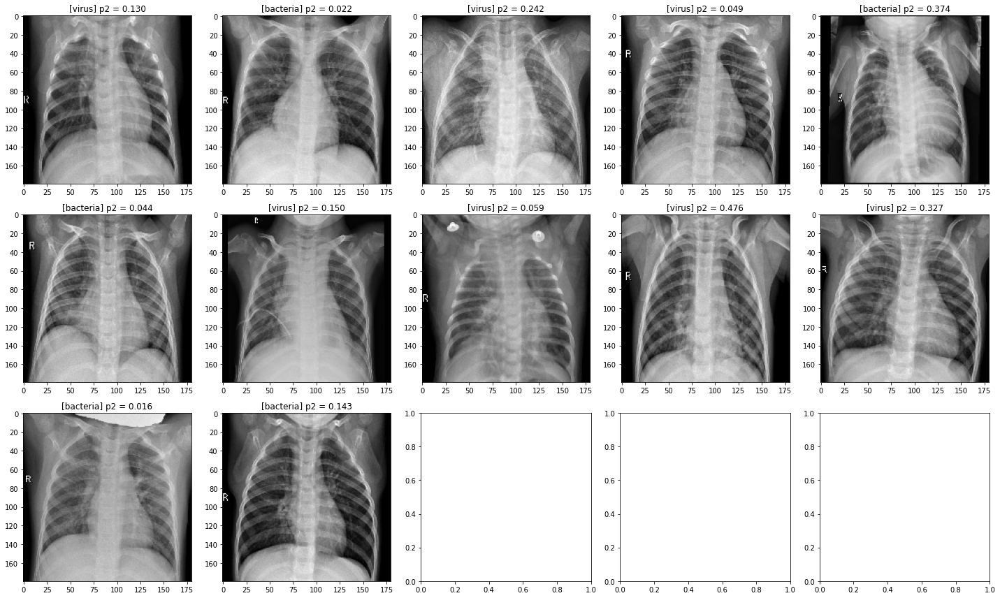

In [139]:
print('PNEUMONIA cases predicted as NORMAL by both models')
print()
n = len(fn_all)
fig, axes = plt.subplots(nrows=(n//5+1), ncols=5, figsize=(20,(n//5+1)*4))

for i in range(n):
    ax = axes[i // 5][i % 5]
    ax.imshow(fn_images[i], cmap='gray')
    ax.set_title('[{}] p2 = {:.3f}'.format(fn_both.iloc[i].type, fn_prob[i]))

plt.tight_layout()
plt.show();

In [140]:
# SAVE THE MODEL
cnn_2.save("cnn_2.h5")

Since both of these 2 models have been trained on highly imbalance class, they both would have the tendency to output more of the abundant class (1 or PNEUMONIA). Although this would certainly help reduce the number of FALSE NEGATIVES (PNEUMONIA cases that are misclassified as NORMAL by the models), there's a possibility that the models have not learned to differentiate the 2 classes effectively.

Between the 2 models, the `cnn_2` model was able to detect more Pneumonia cases.

### Model #3 - Correcting Class Imbalances & Data Augmentation

In [141]:
from sklearn.utils import class_weight

#### Class Weights

In [142]:
class_weights = class_weight.compute_class_weight('balanced',
                                                  classes=train_df['label'].unique(),
                                                  y=train_df['label'])

In [143]:
print(train_df['label'].unique())
print(class_weights)

[0 1]
[1.8796034 0.6812115]


In [144]:
class_weight = {0: class_weights[0], 1: class_weights[1]}
class_weight

{0: 1.8796033994334278, 1: 0.6812114989733059}

#### Image Data Augmentation

Our dataset has close to 6000 images, with some class imbalance. In this case, models' robustness could perhaps be improved with the use of additional synthesized images from the original dataset. Exposing the models to more variants of the data could potentially increase our model's ability to generalize to unseen images.

In [146]:
# CREATE AN AUGMENTATION GENERATOR FOR TRAINING DATASET
aug = ImageDataGenerator(rescale=1.0/255,
                         horizontal_flip=True,
                         rotation_range=10)

- **Horizontal flip** is going to flip the whole image to the right, which might help our model detect cases in which the patiences have this condition. However, it's not too common, so it might end up hurting the model's learning.
- Some of the images in the dataset seem to be slightly rotated (2 of the 7 Pneumonia cases that have been consistenly missed by all 5 models are rotated to the left), therefore I think adding some **rotation** to the `ImageDataGenerator` object might help.

In [147]:
# CREATE NEW GENERATOR FOR TRAINING DATA (FROM train_df DATAFRAME)
aug_train_generator = aug.flow_from_dataframe(
    dataframe=train_df, x_col='image', y_col='label',
    color_mode='grayscale',
    class_mode='raw',
    target_size=(180,180), 
    batch_size=BATCH_SIZE,
    seed=42,
    shuffle=True   # shuffle so we're not missing out on any samples
)

Found 3981 validated image filenames.


In [148]:
images_train, labels_train = next(aug_train_generator)

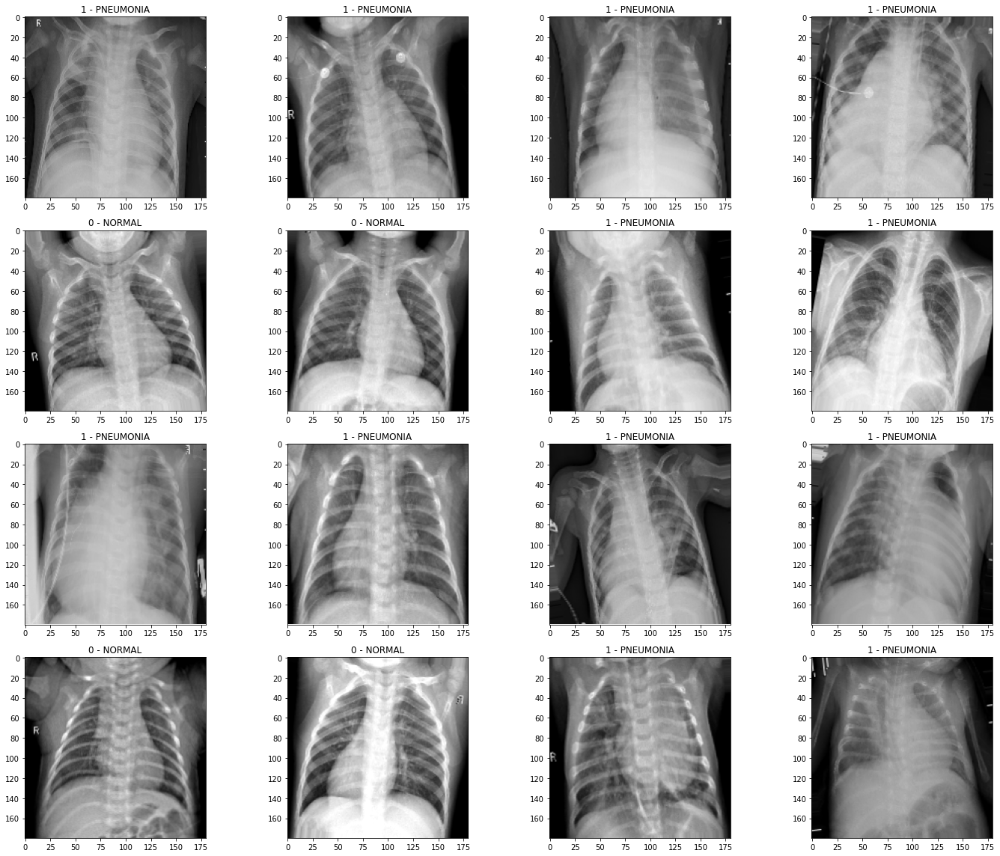

In [149]:
# AUGMENTED DATA VISUALIZAITON
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(20,16))
label_output = {0: 'NORMAL', 1: 'PNEUMONIA'}
i = range(16)

for i in range(16):
    ax = axes[i // 4][i % 4]
    ax.imshow(images_train[i], cmap='gray')
    ax.set_title(f'{labels_train[i]} - {label_output[labels_train[i]]}')
    
plt.tight_layout()
plt.show();

In [172]:
# CONSTRUCT MODEL LAYERS
cnn_3 = Sequential()
cnn_3.add(Conv2D(32, (3,3), activation='relu', padding='same',
               input_shape=[180,180,1]))
cnn_3.add(MaxPooling2D(pool_size=(2,2)))
cnn_3.add(Conv2D(32, (3,3), activation='relu', padding='same'))
cnn_3.add(MaxPooling2D(pool_size=(2,2)))
cnn_3.add(Flatten())
cnn_3.add(Dense(128, activation='relu'))
cnn_3.add(Dense(64, activation='relu'))
cnn_3.add(Dense(1, activation='sigmoid'))

In [173]:
# COMPILE MODEL
cnn_3.compile(loss='binary_crossentropy',
                 optimizer='adam',
                 metrics=['accuracy', recall, precision])

# PRINT OUT MODEL SUMMARY
cnn_3.summary()

Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_11 (Conv2D)           (None, 180, 180, 32)      320       
_________________________________________________________________
max_pooling2d_11 (MaxPooling (None, 90, 90, 32)        0         
_________________________________________________________________
conv2d_12 (Conv2D)           (None, 90, 90, 32)        9248      
_________________________________________________________________
max_pooling2d_12 (MaxPooling (None, 45, 45, 32)        0         
_________________________________________________________________
flatten_6 (Flatten)          (None, 64800)             0         
_________________________________________________________________
dense_17 (Dense)             (None, 128)               8294528   
_________________________________________________________________
dense_18 (Dense)             (None, 64)               

In [174]:
# INSTANTIATE ModelCheckpoint AND EarlyStopping OBJECTS
checkpoint_cb = ModelCheckpoint('cnn_3.h5',
                                save_best_only=True)
early_stopping_cb = EarlyStopping(patience=10,
                                  restore_best_weights=True)

# ASSIGN BATCH SIZE AND EPOCH VALUES
BATCH_SIZE = 32
EPOCHS = 30

# FIT MODEL TO DATA
results_3 = cnn_3.fit(aug_train_generator, 
                      validation_data=val_generator,
                      epochs=EPOCHS,
                      class_weight=class_weight,
                      steps_per_epoch=(aug_train_generator.n//BATCH_SIZE),
                      validation_steps=(val_generator.n//BATCH_SIZE),
                      callbacks=[checkpoint_cb, early_stopping_cb])

Epoch 1/30
124/124 [==============================] - 51s 402ms/step - loss: 0.6692 - accuracy: 0.7036 - recall: 0.8336 - precision: 0.9163 - val_loss: 0.1804 - val_accuracy: 0.9315 - val_recall: 0.9332 - val_precision: 0.9730
Epoch 2/30
124/124 [==============================] - 49s 393ms/step - loss: 0.2700 - accuracy: 0.8899 - recall: 0.8890 - precision: 0.9577 - val_loss: 0.1647 - val_accuracy: 0.9375 - val_recall: 0.9344 - val_precision: 0.9799
Epoch 3/30
124/124 [==============================] - 49s 390ms/step - loss: 0.2285 - accuracy: 0.9092 - recall: 0.9084 - precision: 0.9646 - val_loss: 0.1687 - val_accuracy: 0.9385 - val_recall: 0.9317 - val_precision: 0.9841
Epoch 4/30
124/124 [==============================] - 49s 394ms/step - loss: 0.2181 - accuracy: 0.9083 - recall: 0.9064 - precision: 0.9650 - val_loss: 0.1192 - val_accuracy: 0.9546 - val_recall: 0.9644 - val_precision: 0.9737
Epoch 5/30
124/124 [==============================] - 49s 393ms/step - loss: 0.1923 - accura

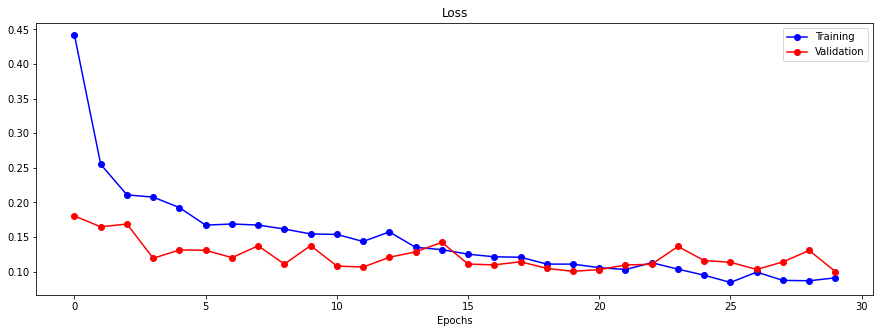

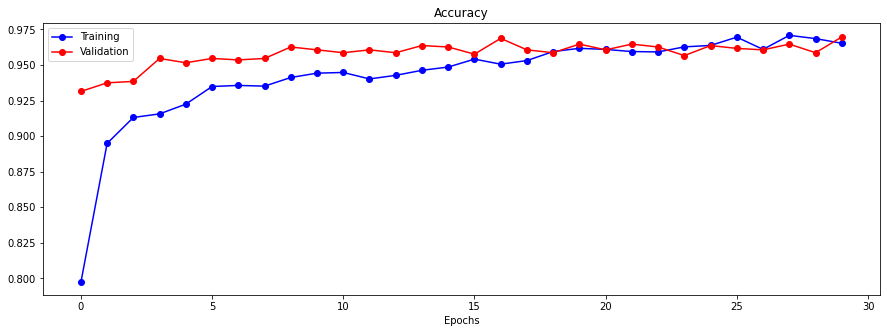

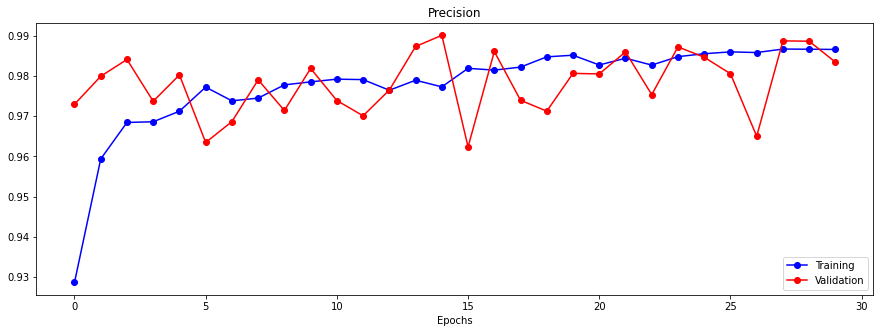

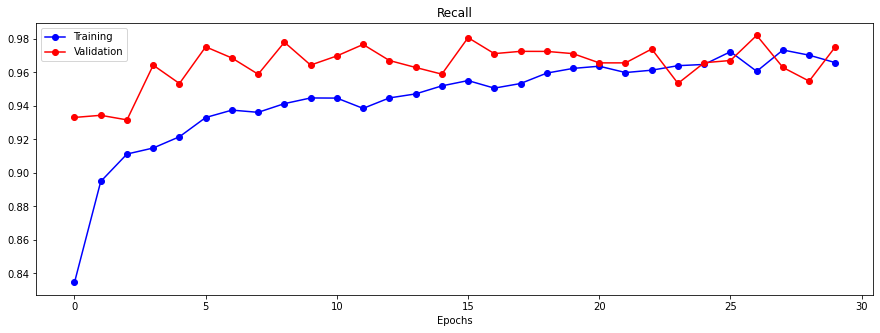

In [176]:
visualize_training_results(results_3)

In [177]:
aug_train_eval_generator = aug.flow_from_dataframe(
    dataframe=train_df, x_col='image', y_col='label',
    class_mode='raw',
    color_mode='grayscale',
    target_size=(180,180), 
    batch_size=BATCH_SIZE,
    seed=2021,
    shuffle=False     # not shuffle so that the predicts come out in the same order as in the original dataset
)

preds_train_3 = cnn_3.predict(aug_train_eval_generator, 
                              steps=(aug_train_eval_generator.n//BATCH_SIZE+1), 
                              verbose=1,
                              workers=8)
preds_val_3 = cnn_3.predict(val_eval_generator, 
                            steps=(val_eval_generator.n//BATCH_SIZE+1),
                            verbose=1,
                            workers=8)

Found 3981 validated image filenames.
32/32 [==============================] - 7s 167ms/step


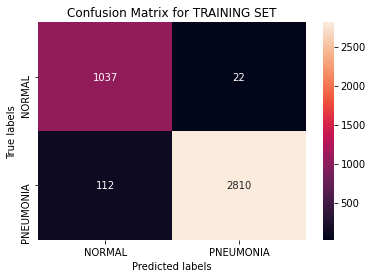

In [179]:
plot_confusionmatrix('TRAINING SET', train_df['label'], np.rint(preds_train_3))

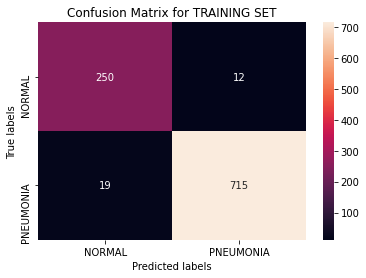

In [180]:
plot_confusionmatrix('TRAINING SET', val_df['label'], np.rint(preds_val_3))

In [184]:
# CALCULATE cnn_4's PERFORMANCE METRICS ON VALIDATION SET
cnn_3_metrics = cnn_3.evaluate(val_eval_generator)
perf_df.loc[len(perf_df.index)] = ['cnn_3'] + cnn_3_metrics
perf_df

32/32 [==============================] - 8s 255ms/step - loss: 0.1014 - accuracy: 0.9689 - recall: 0.9741 - precision: 0.9835


,model,loss,accuracy,recall,precision
0,baseline,0.089163,0.964859,0.974114,0.978112
1,cnn_2,0.113521,0.960843,0.982289,0.965194
2,cnn_3,0.101416,0.968876,0.974114,0.983494


`cnn_3` has lower loss and higher accuracy values than `cnn_2` does; however it has lower recall score, with a False Negative count of 19. Next, I'll look into the similarities and differences between the False Negative cases of`cnn_2` and `cnn_3`.  

In [185]:
# APPEND PREDICTIONS OF THE cnn_3 MODEL TO val_df FOR COMPARISON WITH
# OTHER MODELS
val_df['cnn_3_pred'] = preds_val_3
val_df.head()

,image,label,type,baseline_pred,cnn_2_pred,cnn_3_pred
5635,../input/chest-xray-pneumonia/chest_xray/test/...,1,bacteria,0.998711,0.999361,0.999963
2299,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.996441,0.997072,0.999481
2830,../input/chest-xray-pneumonia/chest_xray/train...,1,bacteria,0.999949,0.999989,1.000000
4891,../input/chest-xray-pneumonia/chest_xray/train...,1,bacteria,0.993053,0.998941,0.999728
4367,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.669913,0.874263,0.991722


In [186]:
# PNEUMONIA CASES THAT HAVE BEEN INCORRECTLY PREDICTED BY cnn_6
fn3 = val_df[(val_df.label - np.rint(val_df.cnn_3_pred)) == 1]
fn3

,image,label,type,baseline_pred,cnn_2_pred,cnn_3_pred
3794,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.130014,0.128975,0.026467
2710,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.961644,0.994785,0.154380
3342,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.548888,0.708838,0.170157
4118,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.049275,0.074938,0.399891
3137,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.562891,0.452445,0.416008
4906,../input/chest-xray-pneumonia/chest_xray/train...,1,bacteria,0.149601,0.056519,0.000999
2761,../input/chest-xray-pneumonia/chest_xray/train...,1,bacteria,0.673455,0.661298,0.036293
3757,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.812141,0.896176,0.228911
3850,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.585144,0.758756,0.442430
2903,../input/chest-xray-pneumonia/chest_xray/train...,1,bacteria,0.326821,0.958639,0.112574


In [194]:
# PNEUMONIA CASES THAT HAVE BEEN INCORRECTLY PREDICTED BY MODELS baseline & cnn_2, 
# BUT CORRECTLY PREDICTED BY MODEL cnn_3
correct_by_3 = val_df[(val_df.label == 1) & \
                      (np.rint(val_df.baseline_pred) == 0) & \
                      (np.rint(val_df.cnn_2_pred) == 0) & \
                      (np.rint(val_df.cnn_3_pred) == 1)]
correct_by_3

,image,label,type,baseline_pred,cnn_2_pred,cnn_3_pred
4488,../input/chest-xray-pneumonia/chest_xray/train...,1,bacteria,0.022183,0.125026,0.534298
3103,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.044302,0.108721,0.614219
4463,../input/chest-xray-pneumonia/chest_xray/train...,1,bacteria,0.058665,0.106653,0.537483
3749,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.286404,0.326252,0.513290
1415,../input/chest-xray-pneumonia/chest_xray/train...,1,bacteria,0.457054,0.317731,0.989401


`cnn_3` was able to correct 5 of the shared false negatives by `baseline` and `cnn_2`. I'm curious to see how these images look like.

In [196]:
img_generator = ImageDataGenerator(rescale=1.0/255).flow_from_dataframe(
    dataframe=correct_by_3, x_col='image', y_col='cnn_3_pred',
    class_mode='raw',
    color_mode='grayscale',
    target_size=(180,180), batch_size=BATCH_SIZE,
    shuffle=False
)

correct_by_3_img, correct_by_3_prob = next(img_generator)

Found 5 validated image filenames.


False Negative cases by baseline and cnn_2 that have been correctly predicted by cnn_3



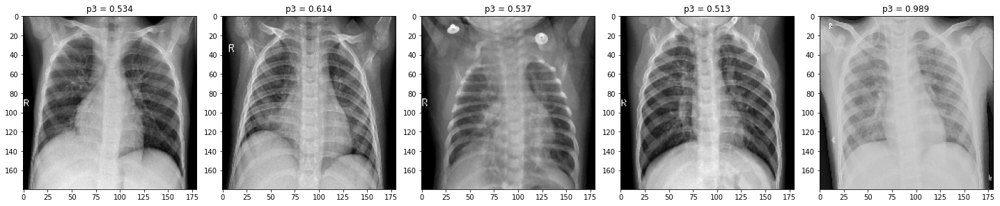

In [198]:
print('False Negative cases by baseline and cnn_2 that have been correctly predicted by cnn_3')
print()
fig, axes = plt.subplots(nrows=1, ncols=5, figsize=(20,4))

for i in range(len(correct_by_3)):
    ax = axes[i]
    ax.imshow(correct_by_3_img[i], cmap='gray')
    ax.set_title('p3 = {:.3f}'.format(correct_by_3_prob[i]))

plt.tight_layout()
plt.show();

In [199]:
# SAVE THE MODEL
cnn_3.save("cnn_3.h5")

### Model #4: Transfer Learning with ResNet50

**ResNet** or **Residual Network** is one of the most powerful deep neural networks: it helped Kaiming He et al. win the ILSVRC in 2015. The winning variant used an extremely deep CNN with 152 layers; but I'm just going to use ResNet50, which is composed of 48 Convolutional Layers, 1 Max Pool, and 1 Average Pool layer.

Deeper networks can usually represent more complex features, therefore increase the model robustness and performance. However, research has found that stacking up more and more layers creates accuracy degradation (accuracy values start to saturate or abruptly decrease), which is caused by the vanishing gradient effect.

As the number of layers increases, the gradient gets smaller and smaller as it reaches the end layers of the network. Therefore, the weights of the initial layers will either update very slowly or remains the same, which means the initial layers of the network won’t learn effectively. 

The key to being able to train deep network effectively is **skip connection** or **shortcut connection** between the layers:
The idea behind it is to add the input feeding into a layer to the output of a layer higher up the stack.
The goal of training a neural network is to make it model a target function `h(x)`. Adding the input `x` to the output of the network would then force the network to model `f(x) = h(x) - x` rather than `h(x)`. This helps speed up training considerably and the networks can start making progress even in several layers have not started learning yet.

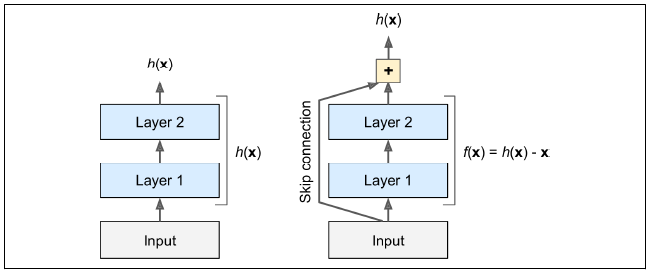

In [73]:
# Resources: 
# https://machinelearningmastery.com/how-to-use-transfer-learning-when-developing-convolutional-neural-network-models/
# https://www.kaggle.com/suniliitb96/tutorial-keras-transfer-learning-with-resnet50
# https://towardsdatascience.com/deep-learning-using-transfer-learning-python-code-for-resnet50-8acdfb3a2d38
# Hands-on Machine Learning with Scikit-Learn, Keras & TensorFlow - Aurelien Geron

In [201]:
from keras.applications.resnet50 import ResNet50
from keras.models import Model

Since ResNet50 expects a (224, 224, 3) input shape, I would recreate train/val/test generators accordingly.

In [257]:
BATCH_SIZE = 32
IMG_SIZE = (224, 224)
INPUT_SHAPE = (224, 224, 3)

# CREATE GENERATOR FOR TRAINING DATA (FROM train_df DATAFRAME)
resnet_train_generator = ImageDataGenerator(rescale=1.0/255).flow_from_dataframe(
    dataframe=train_df, x_col='image', y_col='label',
    color_mode='rgb',    # 3 channels instead of grayscale (1 channel) as before
    class_mode='raw',
    target_size=IMG_SIZE, 
    batch_size=BATCH_SIZE,
    seed=42,
    shuffle=True   # shuffle so we're not missing out on any samples
)

# CREATE GENERATOR FOR VALIDATION DATA (FROM val_df DATAFRAME)
resnet_val_generator = ImageDataGenerator(rescale=1.0/255).flow_from_dataframe(
    dataframe=val_df, x_col='image', y_col='label',
    color_mode='rgb',    # 3 channels   
    class_mode='raw',
    target_size=IMG_SIZE, 
    batch_size=BATCH_SIZE,
    seed=42,
    shuffle=True
)

Found 3981 validated image filenames.
Found 996 validated image filenames.


In [258]:
resnet = ResNet50(include_top=False, 
                  weights='imagenet', 
                  input_shape=(INPUT_SHAPE))

# APPLY OUR OWN GLOBAL MAXPOOLING BASED ON THE OUTPUT OF resnet
gmp = GlobalAveragePooling2D()(resnet.output)

# ADD FINAL DENSE LAYER
output = Dense(1, activation='sigmoid')(gmp)

# BIND ALL
cnn_4 = Model(resnet.input, outputs=output)

# FREEZE THE WEIGHTS OF resnet BASE MODEL 
# SO THAT THEY'RE NON-TRAINABLE
for layer in resnet.layers:
    layer.trainable = False

In [209]:
from keras.optimizers import SGD

In [259]:
# USING SGD TO CUSTOMIZE LEARNING RATE
sgd = SGD(lr=0.02, decay=0.01, momentum=0.9)
cnn_4.compile(optimizer=sgd, 
              loss='binary_crossentropy',
              metrics=['accuracy', recall, precision])
cnn_4.summary()

Model: "model_5"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_9 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 230, 230, 3)  0           input_9[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 112, 112, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 112, 112, 64) 256         conv1_conv[0][0]                 
____________________________________________________________________________________________

In [260]:
checkpoint_cb = ModelCheckpoint('cnn_4.h5',
                                save_best_only=True,
                                monitor='val_loss',
                                mode='min')
early_stopping_cb = EarlyStopping(patience=3,
                                  restore_best_weights=True,
                                  monitor='val_loss',
                                  mode='min')

EPOCHS = 5

results_4 = cnn_4.fit(resnet_train_generator, 
                      validation_data=resnet_val_generator,
                      epochs=EPOCHS,
                      class_weight=class_weight,
                      steps_per_epoch=(resnet_train_generator.n//BATCH_SIZE),
                      validation_steps=(resnet_val_generator.n//BATCH_SIZE),
                      callbacks=[checkpoint_cb, early_stopping_cb])

Epoch 1/5
124/124 [==============================] - 54s 403ms/step - loss: 3.7081 - accuracy: 0.5125 - recall: 0.6592 - precision: 0.8172 - val_loss: 0.4784 - val_accuracy: 0.7974 - val_recall: 0.8071 - val_precision: 0.9077
Epoch 2/5
124/124 [==============================] - 49s 394ms/step - loss: 0.5642 - accuracy: 0.7237 - recall: 0.7324 - precision: 0.8730 - val_loss: 0.9474 - val_accuracy: 0.4778 - val_recall: 0.2992 - val_precision: 0.9777
Epoch 3/5
124/124 [==============================] - 49s 398ms/step - loss: 0.5870 - accuracy: 0.7100 - recall: 0.7002 - precision: 0.8807 - val_loss: 0.6567 - val_accuracy: 0.6835 - val_recall: 0.5923 - val_precision: 0.9644
Epoch 4/5
124/124 [==============================] - 53s 426ms/step - loss: 0.5397 - accuracy: 0.7399 - recall: 0.7358 - precision: 0.8897 - val_loss: 0.7123 - val_accuracy: 0.6542 - val_recall: 0.5431 - val_precision: 0.9778


In [261]:
# UNFREEZE resnet LAYERS FOR 2ND ROUND OF TRAINING:
for layer in resnet.layers:
    layer.trainable = True

In [262]:
# REDUCING LEARNING RATE TO 0.01 TO AVOID DAMANGING THE PRETRAINED WEIGHTS
sgd = SGD(lr=0.01, decay=0.001, momentum=0.9)

# RE-COMPILE MODEL AFTER UNFREEZING ALL LAYERS
cnn_4.compile(optimizer=sgd, 
              loss='binary_crossentropy',
              metrics=['accuracy', recall, precision])

# PRINT OUT MODEL SUMMARY
cnn_4.summary()

Model: "model_5"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_9 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 230, 230, 3)  0           input_9[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 112, 112, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 112, 112, 64) 256         conv1_conv[0][0]                 
____________________________________________________________________________________________

In [263]:
checkpoint_cb = ModelCheckpoint('cnn_4.h5',
                                save_best_only=True,
                                monitor='val_loss',
                                mode='min')
early_stopping_cb = EarlyStopping(patience=10,
                                  restore_best_weights=True,
                                  monitor='val_loss',
                                  mode='min')

# INCREASING NUMBER OF EPOCHS BACK TO 30
EPOCHS = 30

results_4 = cnn_4.fit(resnet_train_generator, 
                      validation_data=resnet_val_generator,
                      epochs=EPOCHS,
                      class_weight=class_weight,
                      steps_per_epoch=(resnet_train_generator.n//BATCH_SIZE),
                      validation_steps=(resnet_val_generator.n//BATCH_SIZE),
                      callbacks=[checkpoint_cb, early_stopping_cb])

Epoch 1/30
124/124 [==============================] - 59s 438ms/step - loss: 0.4247 - accuracy: 0.8580 - recall: 0.7441 - precision: 0.9656 - val_loss: 0.9520 - val_accuracy: 0.7379 - val_recall: 1.0000 - val_precision: 0.7379
Epoch 2/30
124/124 [==============================] - 53s 426ms/step - loss: 0.0724 - accuracy: 0.9713 - recall: 0.9725 - precision: 0.9875 - val_loss: 1.5824 - val_accuracy: 0.7369 - val_recall: 1.0000 - val_precision: 0.7369
Epoch 3/30
124/124 [==============================] - 53s 426ms/step - loss: 0.0440 - accuracy: 0.9817 - recall: 0.9806 - precision: 0.9944 - val_loss: 1.5812 - val_accuracy: 0.7369 - val_recall: 1.0000 - val_precision: 0.7369
Epoch 4/30
124/124 [==============================] - 53s 424ms/step - loss: 0.0202 - accuracy: 0.9939 - recall: 0.9943 - precision: 0.9975 - val_loss: 1.6129 - val_accuracy: 0.7379 - val_recall: 1.0000 - val_precision: 0.7379
Epoch 5/30
124/124 [==============================] - 53s 426ms/step - loss: 0.0110 - accura

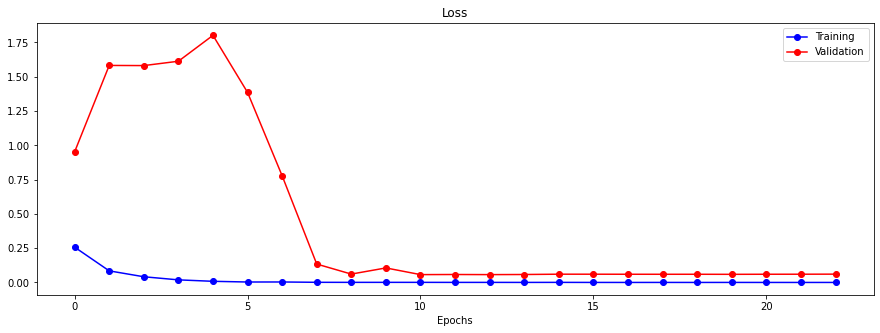

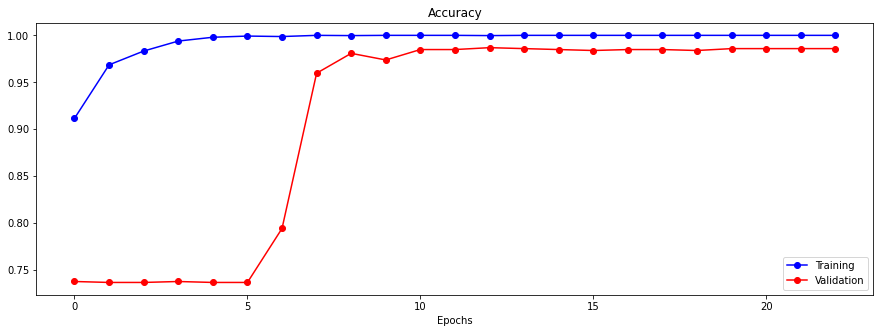

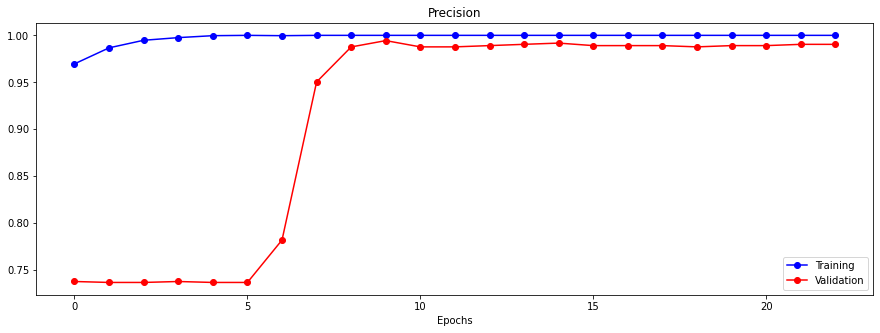

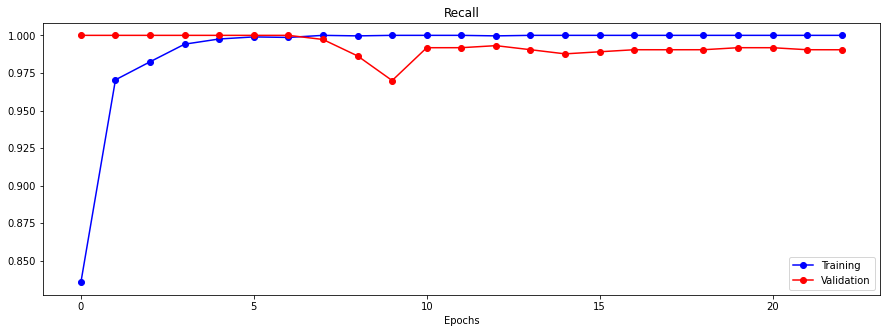

In [264]:
visualize_training_results(results_4)

It's actually very interesting to see how the model appeared to be "stuck" at a local optima(?) the first 8 epochs and barely made any progress, and then turned around and increased accuracy by almost 20% from epoch 8 to epoch 9.

In [265]:
# CREATE GENERATOR FOR TRAINING DATA (FROM train_df DATAFRAME)
resnet_train_eval_generator = ImageDataGenerator(rescale=1.0/255).flow_from_dataframe(
    dataframe=train_df, x_col='image', y_col='label',
    color_mode='rgb',    # 3 channels
    class_mode='raw',
    target_size=IMG_SIZE, 
    batch_size=BATCH_SIZE,
    seed=42,
    shuffle=False   # shuffle so we're not missing out on any samples
)

# CREATE GENERATOR FOR VALIDATION DATA (FROM val_df DATAFRAME)
resnet_val_eval_generator = ImageDataGenerator(rescale=1.0/255).flow_from_dataframe(
    dataframe=val_df, x_col='image', y_col='label',
    color_mode='rgb',    # 3 channels   
    class_mode='raw',
    target_size=IMG_SIZE, 
    batch_size=BATCH_SIZE,
    seed=42,
    shuffle=False
)

preds_train_4 = cnn_4.predict(resnet_train_eval_generator, 
                                steps=(resnet_train_eval_generator.n//BATCH_SIZE+1), 
                                verbose=1,
                                workers=8)
preds_val_4 = cnn_4.predict(resnet_val_eval_generator, 
                              steps=(resnet_val_eval_generator.n//BATCH_SIZE+1),
                              verbose=1,
                              workers=8)

Found 3981 validated image filenames.
Found 996 validated image filenames.
32/32 [==============================] - 8s 188ms/step


In [267]:
perf_df.drop([3,4], inplace=True)

In [268]:
cnn_4_metrics = cnn_4.evaluate(resnet_val_eval_generator)
perf_df.loc[len(perf_df.index)] = ['cnn_4'] + cnn_4_metrics
perf_df

32/32 [==============================] - 10s 303ms/step - loss: 0.0570 - accuracy: 0.9869 - recall: 0.9932 - precision: 0.9891


,model,loss,accuracy,recall,precision
0,baseline,0.089163,0.964859,0.974114,0.978112
1,cnn_2,0.113521,0.960843,0.982289,0.965194
2,cnn_3,0.101416,0.968876,0.974114,0.983494
3,cnn_4,0.056972,0.986948,0.993188,0.989145


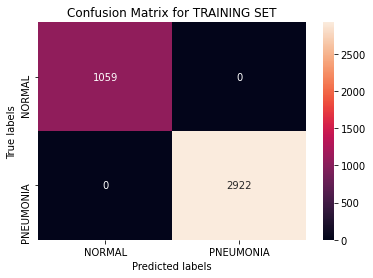

In [269]:
plot_confusionmatrix('TRAINING SET', train_df['label'], np.rint(preds_train_4))

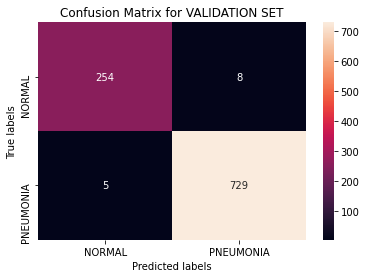

In [270]:
plot_confusionmatrix('VALIDATION SET', val_df['label'], np.rint(preds_val_4))

In [271]:
# APPEND PREDICTIONS OF THE cnn_4 MODEL TO val_df FOR COMPARISON WITH
# OTHER MODELS LATER
val_df['cnn_4_pred'] = preds_val_4

In [272]:
val_df.head()

,image,label,type,baseline_pred,cnn_2_pred,cnn_3_pred,cnn_4_pred
5635,../input/chest-xray-pneumonia/chest_xray/test/...,1,bacteria,0.998711,0.999361,0.999963,1.000000
2299,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.996441,0.997072,0.999481,1.000000
2830,../input/chest-xray-pneumonia/chest_xray/train...,1,bacteria,0.999949,0.999989,1.000000,1.000000
4891,../input/chest-xray-pneumonia/chest_xray/train...,1,bacteria,0.993053,0.998941,0.999728,0.999995
4367,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.669913,0.874263,0.991722,0.999927


In [273]:
# PNEUMONIA CASES THAT HAVE BEEN INCORRECTLY PREDICTED BY cnn_4
fn4 = val_df[(val_df.label - np.rint(val_df.cnn_4_pred)) == 1]
fn4

,image,label,type,baseline_pred,cnn_2_pred,cnn_3_pred,cnn_4_pred
3137,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.562891,0.452445,0.416008,0.226637
1528,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.015524,0.063868,0.009103,0.000019
4842,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.142521,0.947757,0.104736,0.119818
5190,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.035315,0.013930,0.003409,0.012162
4529,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.344601,0.182111,0.315427,0.412714


In [274]:
# PNEUMONIA CASES THAT HAVE BEEN INCORRECTLY PREDICTED BY 3 MODELS baseline, cnn_2, cnn_3
# BUT ACCURATELY CLASSIFIED BY cnn_4
correct_by_4 = val_df[(val_df.label == 1) & \
                    (np.rint(val_df.baseline_pred) == 0) & \
                    (np.rint(val_df.cnn_2_pred) == 0) & \
                    (np.rint(val_df.cnn_3_pred) == 0) & \
                    (np.rint(val_df.cnn_4_pred) == 1)]
correct_by_4

,image,label,type,baseline_pred,cnn_2_pred,cnn_3_pred,cnn_4_pred
3794,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.130014,0.128975,0.026467,0.999378
4118,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.049275,0.074938,0.399891,0.742210
4906,../input/chest-xray-pneumonia/chest_xray/train...,1,bacteria,0.149601,0.056519,0.000999,0.999200
2337,../input/chest-xray-pneumonia/chest_xray/train...,1,bacteria,0.201591,0.146551,0.037489,0.676102


In [275]:
img_generator = ImageDataGenerator(rescale=1.0/255).flow_from_dataframe(
    dataframe=correct_by_4, x_col='image', y_col='cnn_4_pred',
    class_mode='raw',
    color_mode='grayscale',
    target_size=(180,180), batch_size=BATCH_SIZE,
    shuffle=False
)

correct_by_4_img, correct_by_4_prob = next(img_generator)

Found 4 validated image filenames.


False Negative cases by 3 previous models but corrected by cnn_4:



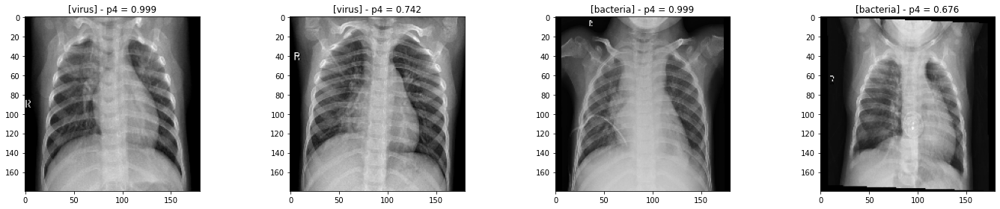

In [321]:
print('False Negative cases by 3 previous models but corrected by cnn_4:')
print()
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(20,4))

for i in range(len(correct_by_4)):
    ax = axes[i]
    ax.imshow(correct_by_4_img[i], cmap='gray')
    ax.set_title('[{}] - p4 = {:.3f}'.format(correct_by_4.iloc[i].type, correct_by_4_prob[i]))

plt.tight_layout()
plt.show();

In [277]:
# SAVE THE MODEL
cnn_4.save("cnn_4.h5")

### Model Evaluation
Among 4 models, `cnn_4` has the best performance all across the board and the lowest count of False Negatives. Therefore, I would proceed to do a final evaluation of its performance on the test set.

In [278]:
# CREATE GENERATOR FOR VALIDATION DATA (FROM test_df DATAFRAME)
resnet_test_generator = ImageDataGenerator(rescale=1.0/255).flow_from_dataframe(
    dataframe=test_df, x_col='image', y_col='label',
    color_mode='rgb',    # 3 channels   
    class_mode='raw',
    target_size=IMG_SIZE, 
    batch_size=BATCH_SIZE,
    seed=42,
    shuffle=False
)

Found 879 validated image filenames.


In [279]:
preds_test_4 = cnn_4.predict(resnet_test_generator, 
                             steps=(resnet_test_generator.n//BATCH_SIZE+1),
                             verbose=1,
                             workers=8)

28/28 [==============================] - 8s 231ms/step


In [280]:
cnn_4.evaluate(resnet_test_generator)

28/28 [==============================] - 9s 305ms/step - loss: 0.0844 - accuracy: 0.9818 - recall: 0.9903 - precision: 0.9839


[0.08439867198467255,
 0.9817975163459778,
 0.990275502204895,
 0.9838969111442566]

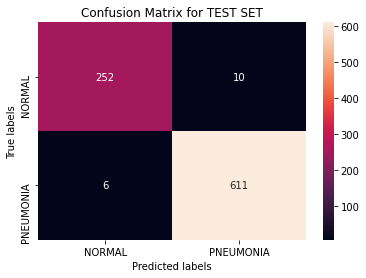

In [281]:
plot_confusionmatrix('TEST SET', test_df['label'], np.rint(preds_test_4))

Out of 617 actual Pneumonia X-rays, `cnn_4` was able to accurately detect 611, which gives us a very high Recall score of 99.02%. Overall, the model has an Accuracy score of 98.17% on the Test dataset. 

#### Grad-CAM Class Activation Visualization

Neural Networks are commonly referred to as black-box models because the structure of the networks does not really give us any insights on the structure of the function modeled. 

**Gradient Class Activation Map** (**Grad-CAM**) for a particular class indicates regions on the images that the CNN used to identify that class. Since this project is a binary classification task, Grad-CAM would hopefully highlight discriminative areas of the X-ray that the models used to differentiate Pneumonia vs. Normal.

In [282]:
# Reference: https://stackoverflow.com/questions/66182884/how-to-implement-grad-cam-on-a-trained-network

class GradCAM:
    def __init__(self, model, classs, layerName=None):
        # store the model, the class index used to measure the class
        # activation map, and the layer to be used when visualizing
        # the class activation map
        self.model = model
        self.classs = classs
        self.layerName = layerName
        # if the layer name is None, attempt to automatically find
        # the target output layer
        if self.layerName is None:
            self.layerName = self.find_target_layer()

    def find_target_layer(self):
        # attempt to find the final convolutional layer in the network
        # by looping over the layers of the network in reverse order
        for layer in reversed(self.model.layers):
            # check to see if the layer has a 4D output
            if len(layer.output_shape) == 4:
                return layer.name
        # otherwise, we could not find a 4D layer so the GradCAM
        # algorithm cannot be applied
        raise ValueError("Could not find 4D layer. Cannot apply GradCAM.")


    def compute_heatmap(self, image, eps=1e-8):
        # construct our gradient model by supplying (1) the inputs
        # to our pre-trained model, (2) the output of the (presumably)
        # final 4D layer in the network, and (3) the output of the
        # softmax activations from the model
        gradModel = Model(
            inputs=[self.model.inputs],
            outputs=[self.model.get_layer(self.layerName).output, self.model.output])

        # record operations for automatic differentiation
        with tf.GradientTape() as tape:
            # cast the image tensor to a float-32 data type, pass the
            # image through the gradient model, and grab the loss
            # associated with the specific class index
            inputs = tf.cast(image, tf.float32)
            (convOutputs, predictions) = gradModel(inputs)
            
            loss = predictions[:, tf.argmax(predictions[0])]
    
        # use automatic differentiation to compute the gradients
        grads = tape.gradient(loss, convOutputs)

        # compute the guided gradients
        castConvOutputs = tf.cast(convOutputs > 0, "float32")
        castGrads = tf.cast(grads > 0, "float32")
        guidedGrads = castConvOutputs * castGrads * grads
        # the convolution and guided gradients have a batch dimension
        # (which we don't need) so let's grab the volume itself and
        # discard the batch
        convOutputs = convOutputs[0]
        guidedGrads = guidedGrads[0]

        # compute the average of the gradient values, and using them
        # as weights, compute the ponderation of the filters with
        # respect to the weights
        weights = tf.reduce_mean(guidedGrads, axis=(0, 1))
        cam = tf.reduce_sum(tf.multiply(weights, convOutputs), axis=-1)

        # grab the spatial dimensions of the input image and resize
        # the output class activation map to match the input image
        # dimensions
        (w, h) = (image.shape[2], image.shape[1])
        heatmap = cv2.resize(cam.numpy(), (w, h))
        # normalize the heatmap such that all values lie in the range
        # [0, 1], scale the resulting values to the range [0, 255],
        # and then convert to an unsigned 8-bit integer
        numer = heatmap - np.min(heatmap)
        denom = (heatmap.max() - heatmap.min()) + eps
        heatmap = numer / denom
        heatmap = (heatmap * 255).astype("uint8")
        # return the resulting heatmap to the calling function
        return heatmap

    def overlay_heatmap(self, heatmap, image, alpha=0.5,
                        colormap=cv2.COLORMAP_VIRIDIS):
        # apply the supplied color map to the heatmap and then
        # overlay the heatmap on the input image
        heatmap = cv2.applyColorMap(heatmap, colormap)
        output = cv2.addWeighted(image, alpha, heatmap, 1 - alpha, 0)
        # return a 2-tuple of the color mapped heatmap and the output,
        # overlaid image
        return (heatmap, output)

In [312]:
for idx in range(len(cnn_4.layers)):
    print(cnn_4.get_layer(index = idx).name)

input_9
conv1_pad
conv1_conv
conv1_bn
conv1_relu
pool1_pad
pool1_pool
conv2_block1_1_conv
conv2_block1_1_bn
conv2_block1_1_relu
conv2_block1_2_conv
conv2_block1_2_bn
conv2_block1_2_relu
conv2_block1_0_conv
conv2_block1_3_conv
conv2_block1_0_bn
conv2_block1_3_bn
conv2_block1_add
conv2_block1_out
conv2_block2_1_conv
conv2_block2_1_bn
conv2_block2_1_relu
conv2_block2_2_conv
conv2_block2_2_bn
conv2_block2_2_relu
conv2_block2_3_conv
conv2_block2_3_bn
conv2_block2_add
conv2_block2_out
conv2_block3_1_conv
conv2_block3_1_bn
conv2_block3_1_relu
conv2_block3_2_conv
conv2_block3_2_bn
conv2_block3_2_relu
conv2_block3_3_conv
conv2_block3_3_bn
conv2_block3_add
conv2_block3_out
conv3_block1_1_conv
conv3_block1_1_bn
conv3_block1_1_relu
conv3_block1_2_conv
conv3_block1_2_bn
conv3_block1_2_relu
conv3_block1_0_conv
conv3_block1_3_conv
conv3_block1_0_bn
conv3_block1_3_bn
conv3_block1_add
conv3_block1_out
conv3_block2_1_conv
conv3_block2_1_bn
conv3_block2_1_relu
conv3_block2_2_conv
conv3_block2_2_bn
conv3_

Based on the printout above, the name of `cnn_4`'s last convolutional layer is `conv5_block3_out` (The last Convolusional Layer can be thought of as the features of a model).

In [377]:
last_conv_layer = 'conv5_block3_out'

In [363]:
# PREDICTION ON A VIRAL X-RAY
# PATH TO 1 OF THE 4 IMAGES THAT WAS MISSED BY THE FIRST 3 MODELS AND 
# CORRECTLY IDENTIFIED BY cnn_4
img_path = correct_by_4.iloc[0].image

image = cv2.imread(img_path)
image = cv2.resize(image, (224, 224))
image = image.astype('float32') / 255
image = np.expand_dims(image, axis=0)

preds = cnn_4.predict(image) 
i = round(preds[0][0])

In [364]:
icam = GradCAM(cnn_4, i, last_conv_layer) 
heatmap = icam.compute_heatmap(image)
heatmap = cv2.resize(heatmap, (224, 224))

image = cv2.imread(img_path)
image = cv2.resize(image, (224, 224))
print(heatmap.shape, image.shape)

(heatmap, output) = icam.overlay_heatmap(heatmap, image, alpha=0.5)

(224, 224) (224, 224, 3)


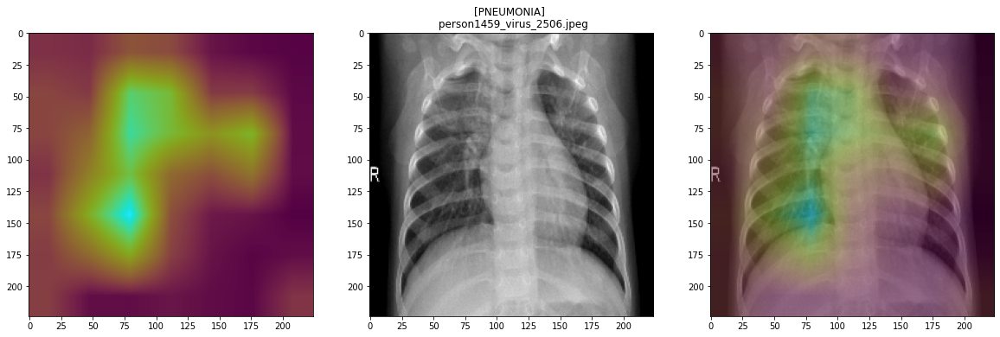

In [365]:
fig, ax = plt.subplots(1, 3, figsize=(20,7))

ax[0].imshow(heatmap)
ax[1].imshow(image)
ax[1].set_title(f"[{img_path.split('/')[-2]}] \n {img_path.split('/')[-1]}")
ax[2].imshow(output)
plt.savefig('gradcam1.png', bbox_inches='tight', dpi=300);

In [366]:
# PREDICTION ON A BACTERIAL PNEUMONIA X-RAY
# ANOTHER IMAGES THAT WAS MISSED BY THE FIRST 3 MODELS AND 
# CORRECTLY IDENTIFIED BY cnn_4
img_path = correct_by_4.iloc[2].image

image = cv2.imread(img_path)
image = cv2.resize(image, (224, 224))
image = image.astype('float32') / 255
image = np.expand_dims(image, axis=0)

preds = cnn_4.predict(image) 
i = round(preds[0][0])

In [367]:
icam = GradCAM(cnn_4, i, last_conv_layer) 
heatmap = icam.compute_heatmap(image)
heatmap = cv2.resize(heatmap, (224, 224))

image = cv2.imread(img_path)
image = cv2.resize(image, (224, 224))
print(heatmap.shape, image.shape)

(heatmap, output) = icam.overlay_heatmap(heatmap, image, alpha=0.5)

(224, 224) (224, 224, 3)


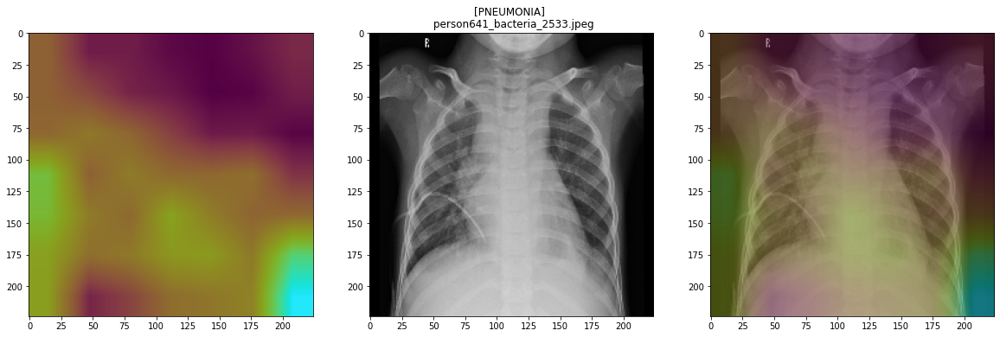

In [368]:
fig, ax = plt.subplots(1, 3, figsize=(20,7))

ax[0].imshow(heatmap)
ax[1].imshow(image)
ax[1].set_title(f"[{img_path.split('/')[-2]}] \n {img_path.split('/')[-1]}")
ax[2].imshow(output)
plt.savefig('gradcam2.png', bbox_inches='tight', dpi=300);

Grad-CAM output for this image shows that the model actually used most of the surrounding as the differentiating factor. It does highlight some ares in the Chest as well.

In [370]:
val_df[(val_df.label == 0) & (np.rint(val_df.cnn_4_pred) == 0)].head()

,image,label,type,baseline_pred,cnn_2_pred,cnn_3_pred,cnn_4_pred
378,../input/chest-xray-pneumonia/chest_xray/train...,0,normal,0.004886,0.003124,0.000110,2.321741e-08
1136,../input/chest-xray-pneumonia/chest_xray/train...,0,normal,0.002629,0.008073,0.000659,2.225377e-04
970,../input/chest-xray-pneumonia/chest_xray/train...,0,normal,0.004164,0.004373,0.000101,7.494602e-11
618,../input/chest-xray-pneumonia/chest_xray/train...,0,normal,0.004289,0.012027,0.000060,1.142990e-05
842,../input/chest-xray-pneumonia/chest_xray/train...,0,normal,0.001486,0.002001,0.000033,2.119911e-07


In [371]:
# PREDICTION ON A NORMAL X-RAY
img_path = val_df.loc[378].image

image = cv2.imread(img_path)
image = cv2.resize(image, (224, 224))
image = image.astype('float32') / 255
image = np.expand_dims(image, axis=0)

preds = cnn_4.predict(image) 
i = round(preds[0][0])

In [372]:
icam = GradCAM(cnn_4, i, last_conv_layer) 
heatmap = icam.compute_heatmap(image)
heatmap = cv2.resize(heatmap, (224, 224))

image = cv2.imread(img_path)
image = cv2.resize(image, (224, 224))
print(heatmap.shape, image.shape)

(heatmap, output) = icam.overlay_heatmap(heatmap, image, alpha=0.5)

(224, 224) (224, 224, 3)


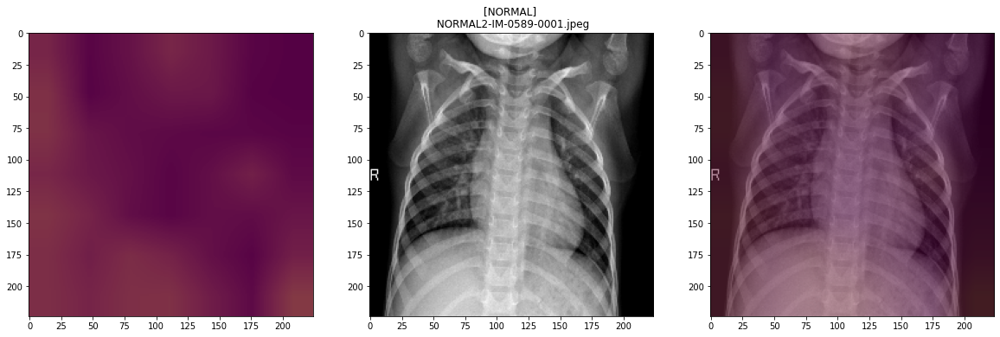

In [373]:
fig, ax = plt.subplots(1, 3, figsize=(20,7))

ax[0].imshow(heatmap)
ax[1].imshow(image)
ax[1].set_title(f"[{img_path.split('/')[-2]}] \n {img_path.split('/')[-1]}")
ax[2].imshow(output)
plt.savefig('gradcam3.png', bbox_inches='tight', dpi=300);

We can see that in a Normal radiograph, nothing is highlighted.

In [340]:
# SAVE DATAFRAMES 
val_df.to_pickle('../working/val_df.pkl')
perf_df.to_pickle('../working/performance_df.pkl')

In [374]:
val_df[(val_df.label == 1) & (val_df.cnn_4_pred > 0.9)].head()

,image,label,type,baseline_pred,cnn_2_pred,cnn_3_pred,cnn_4_pred
5635,../input/chest-xray-pneumonia/chest_xray/test/...,1,bacteria,0.998711,0.999361,0.999963,1.000000
2299,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.996441,0.997072,0.999481,1.000000
2830,../input/chest-xray-pneumonia/chest_xray/train...,1,bacteria,0.999949,0.999989,1.000000,1.000000
4891,../input/chest-xray-pneumonia/chest_xray/train...,1,bacteria,0.993053,0.998941,0.999728,0.999995
4367,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.669913,0.874263,0.991722,0.999927


In [ ]:
# PREDICTION ON A PNEUMONIA X-RAY
# WITH OVER 0.9 PROBABILITY
img_path = val_df.loc[5635].image

image = cv2.imread(img_path)
image = cv2.resize(image, (224, 224))
image = image.astype('float32') / 255
image = np.expand_dims(image, axis=0)

preds = cnn_4.predict(image) 
i = round(preds[0][0])

In [380]:
icam = GradCAM(cnn_4, i, last_conv_layer) 
heatmap = icam.compute_heatmap(image)
heatmap = cv2.resize(heatmap, (224, 224))

image = cv2.imread(img_path)
image = cv2.resize(image, (224, 224))
print(heatmap.shape, image.shape)

(heatmap, output) = icam.overlay_heatmap(heatmap, image, alpha=0.5)

(224, 224) (224, 224, 3)


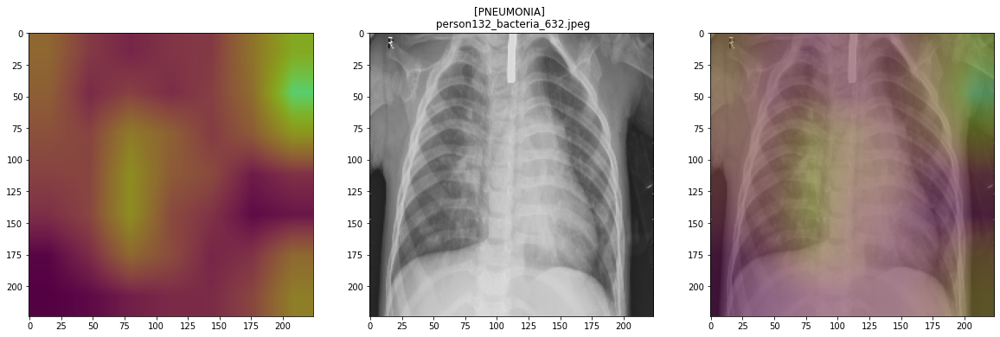

In [381]:
fig, ax = plt.subplots(1, 3, figsize=(20,7))

ax[0].imshow(heatmap)
ax[1].imshow(image)
ax[1].set_title(f"[{img_path.split('/')[-2]}] \n {img_path.split('/')[-1]}")
ax[2].imshow(output)
plt.savefig('gradcam4.png', bbox_inches='tight', dpi=300);

Again, the model seemed to have identified something in the lungs area, and the armpit(?). 

## Conclusion

Although the final model has achieved very high performance scores across the board (Accuracy, Recall, as well as Precision), Grad-CAM has showed us that the model is still picking up some regions outside the lungs area. 

Rather than purely pursuing better metric scores, it'd be best to take advantage of experts' domain knowledge, and have these Grad-CAM outputs reviewed by clinicians and radiologists who can provide input on whether or not the model has identified correct/potential regions the chest area that might be indicators of Pneumonia. 


## Next Steps

In the future I would want to consider incorporating Object Detection/Localization into the models so that the output would not only be whether or not the X-ray exhibit abnormal pulmonary patterns typically observed in Pneumonia, but also the location of the identified patterns. However, this types of tasks usually requires data that have been labeled with bounding boxes or similar annotations, which could be very labor intensive and costly. 

## References
1. Géron, A. (2019). *In Hands-on machine learning with Scikit-Learn &amp; TensorFlow: concepts, tools, and techniques to build intelligent systems.* O'Reilly Media, Inc. 
2. https://machinelearningmastery.com/how-to-use-transfer-learning-when-developing-convolutional-neural-network-models/
3. https://www.kaggle.com/suniliitb96/tutorial-keras-transfer-learning-with-resnet50
4. https://towardsdatascience.com/deep-learning-using-transfer-learning-python-code-for-resnet50-8acdfb3a2d38
5. [Wikipedia](https://en.wikipedia.org/wiki/Pneumonia)